In [1]:
%matplotlib inline

In [2]:
import os
from random import randint, seed
from time import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import pickle

from nose.tools import *

In [3]:
# imports for image pre-processing
from skimage import io, filters, util, feature, measure, morphology, color, transform
from scipy.ndimage import interpolation as inter
import cv2
import imutils
import matplotlib.patches as patches
import seaborn as sns

In [4]:
#imports for ML
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.model_selection import cross_validate

from sklearn.metrics import f1_score, make_scorer, accuracy_score, classification_report, confusion_matrix

from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier

In [5]:
seed(42)

# License Plate Recognition

##### Final exam report

*Viktor Belchev - student*

*Machine Learning - Software University*

*November 2020*

### Abstract

License Plate Recognition (LPR) is already quite researched area. Due to its importance in our constantly moving "on wheels" world lots of companies and scientists have invested their time and efforts in it. It might be trivial already but it is worth mentioning its importance in many security applications which include road traffic monitoring, traffic law enforcement, street activity monitoring, identification of potential threats, etc.  It is also commonly used as an electronic payment 
system for toll payment or parking fee payment. 

Having said all above, I consider creating an LPR a mandatory step in Machine learning when somebody wishes to develop himself in the field of Computer Vision. There are numerous methods used for LPR, and my idea is to search and if possible to find a way that makes it as easy as it can (without using DL models) so that everyone of us will be able to use and apply it "at home". Of course, it is just an initial attempt that will need numerous improvements to get to its final idea, but I will try to show the available possibilities as seen by a ML student in SoftUni like me.

There are three key factors described in most publications on this topic: **image size, processing time and success rate**. I must mention that usually when creating such an installation, there are many prerequisits that are set in advance as constraints. That way the captured image has the smallest possible angle with smallest image distortions. We can add to that the high resolution capability of the capturing cameras and the constant size of the picture as well. This way the software's task is simplified, thus the processing time reduced and success rate, tremendessly increased.

In this notebook, the idea will be more to present the way a LPR can be easily done on images using the knowledge acquired during the Machine Learning course in SoftUni. The notebook represents in fact a final exam report on Machine learning, so the task related to ML will remain main focus inside. I will try to avoid any tools that require more complicated convolutions and Deep Learning models.

***I.*** **Introduction**

No matter the source, when desribing the Licence plate recognition process, it includes these three main steps:
1) **detection and localization of number plate** : first step is to detect the License plate from the vehicle. The accuracy can be improved if we know the exact size, color and approximate location of the number plate. As I tried to explain above, normally, the detection algorithm is trained based on the position of camera, the camera's output and type of number plate used in that particular country. It can get trickier if the image does not even have a car :) - for such cases before starting with this step we will have to add an additional detection of a car first.

2) **character segmentation** : once we have detected the License Plate we have to crop it out and save it as a new image. Now, the new image obtained should have some characters (Numbers/Alphabets) written on it. If that is the case, each character will be extracted and localized from this cropped area.

3) **character recognition / digits classification**: we can now perform some Machine Learning algorithm on found characters to detect the number. The easiest would be by using the advanced technology of OCR (Optical Character Recognition - this method would also broader the geographical application of the application as well). In order to choose a powerful algorithm by remaining in the field of ML as suggested in many of the checked ressources, in this project the focus would be on SVM (broadly used as base method in many OCR algorithms), comparing different SVR model. Additionally, SVM will be compared with Dense NN (Fully Connected Neural Network) and kNN, also used in this field, in order to choose the best model.

In general, all algorithms can be used in case following conditions are met:
 - the background is stationairy
 - we have constant illumination
 - we use a sigle view - elminating problems of distortions and homography,
 
but in real-life all of these are constantly changing. We can also add the problems of different type of license plates, type of fonts, color and language of the plate, different plate "organization", <a href="http://www.worldlicenseplates.com/">size of plates for different vehicles woldwide</a> from one side. On top of it dependa a lot on different the weather conditions (fog, rain, etc.), impurities, rust, mud and dust covering partially or event entirely the characters. 

That is why, the preprocessing of the image (or a frame in case of video) is really, really, REALLY important.

Based on the steps listed above the structure of this paper is organised as follows:

Section II describes the number plate detection, localization and extraction methods and the logic behind the decisions taken on this step of the automatization process. 

The license plate segmentation or character segmentation is discussed in Section III. These two sections cover the so called pre-processing.

Section IV discusses the character recognition (license number) using ML models. Here, a different models will be trained on the available datasets of characters and using available methods in `sklearn` module the most suitable hyperparameters for the respective model will be tuned.

In Section V the application of the trained model for character recognition and test the selected learning algorithms with some examples based on a dataset of car pictures taken from the <a href="https://ai.stanford.edu/~jkrause/cars/car_dataset.html">Stanford Cars Dataset</a> and eventially final choice of applied model will be done.

And finally, Section VI summarises and concludes the findings as well as the room for improvements. 

***II.*** **Detection and localization of the License Plate**

Localization of license plate refers to extracting the region in an image that contains the plate and some of the widely used techniques for localization include scale shape analysis, edge detection, mathematical morphology, connected component analysis, regional segmentation, and statistical classification. Different algorithms have claimed their accuracy for localization from 80% to 96%, but I guess on with some pre-set conditions. You will see later in this document the achieved success rate on a dataset of pictures with cars and plates which position of the license plate is recognisable by human.

The Wavelet transformation is one of the methods used in this part of the LPR which is suitable for less complex background images. It is less complex algorithm which is ideal for limited computational power. The wavelet transformation is used to identify the horizontal edges by scanning the ROI (regions of interest) of the license plate. Next, by using the knowledge of the license plate aspect ratio, the horizontal edges are scanned with a block of the aspect ratio size to get the license plate location. BUT When the background is more complex and has many edges, it will become computationally complex.
 
The Morphology-based method act as follows - as license plate is normally designed in rectangular shape, this method used the geometrical attribute of a license plate shape for detection. After applying morphology operations (erosion followed by dilation), the input image will have to undergo binarisation in order to find the contours. The binary image allow the process of acquiring a rectangular region in the image. This is less computationally complex algorithm BUT again, when background is complex, might contain more false license plate detection.
 
Combining the colour feature and the edge information in order to extract the license plate is a more reliable way. In the localisation based on colour segmentation, HSV colour space model could be used as license plate colour threshold interval for binarisation purpose. As one can see, I will not use these colour features but will keep the main idea of this process. After removing noises in the binary image, the morphological operation is used to fill the gaps of certain disconnected areas. Then, the license plate region is extracted based on the contours rectangular shape ratio and the contours area size which meet the characteristics of a license plate. The method use <u>Otsu</u> and <u>Sobel</u> operator as edge detection method. The candidate region obtained from the two edge detection methods was intercepted to get the final license plate location. Unfortunately, combining two features is more computationally complex which will result in slower processing time.
 
Finally, the methods using the rectangular shape ratio are possible thanks to the standardization of the sizes of the license plate. Currently, there are 6 commonly used worldwide sizes, as shown in the picture below:

<a title="Allo002 (conversion and slight mod by -- Tuválkin ✉ 23:18, 11 September 2014 (UTC)) / CC BY-SA (https://creativecommons.org/licenses/by-sa/3.0)" href="https://commons.wikimedia.org/wiki/File:License_plate_sizes.svg"><img width="512" alt="License plate sizes" src="final_thesis_pics_folder/license_plate_sizes_WW.JPG"></a>

In this notebook, I will use two algorithms for plate detection, that should generally lead to similar results. The first algorithm uses <a href="https://en.wikipedia.org/wiki/Connected-component_labeling">concept of connected component analysis (CCA)</a> to find the region with rectangular shape that would corresponds to plate. For that first a binarisation of the gray-scaled picture using Otsu's method is used. Of course, apart from the rectangular shape there are other thresholding conditions that will be applied to choose the best region of interest.

The other proposed alogrithm in this notebook is similar to the one taken from Automatic Iranian Vehicle License Plate Recognition System Basedon Support Vector Machine (SVM) Algorithms. It has the following general scheme:
<img src="final_thesis_pics_folder\figure1.png"> 

On this figure, the input image is first converted to gray-level images. After applying Sobel Operator, the image edge information is obtained. Then, morphological operations are applied to join the image edges in order to create plate candidate regions. These regions which have been identified will be filled with morphology operations. In the next step, candidate regions have been studied with an accurate threshold level, and non-candidate areas will be deleted. 

I will use this same scheme to briefly discuss the remaining part described more in depth in the following sections as it is going to be applicable no matter the chosen technics for the plate region detection descibed above: usually, there is some skewing of the original picture. Thus, the discovered plate part of the picture needs a deskewing operation. One way to solve this is by using the Radon transform (as described by Vladimir Shapiro, Georgi Gluhchev and Dimo Dimov in <a href="https://www.researchgate.net/publication/220465207_Towards_a_Multinational_Car_License_Plate_Recognition_System">"Towards a Multinational Car License Plate Recognition system"</a>, but unfortunately it is too  computationally costly. Therefore, the plate can be examined in terms of degree of rotation using the faster Hough Transform where a higher precision was sought. In case where the rotation is not big, a simple vertical histogram projection can be applied to find the best deskewing angle. Next, rotation adjustment will be done. Only after that, the plate characters are separated. Finally, on the figure the plate characters are recognized using ML model.

The explained logic in this scheme need to be translated now into programming code and functions.

In order to test and present the way of working of the porposed codes, I will use one demo image and apply each created function on it. This demonstatinal cells will be followed by a cell containing the program (general function) that will be used to get to the final tests on whole car images dataset. Whenever possible, I will try to create functions that are applicable both for this demo image and for the whole set of images. 

In [6]:
## demo code:
directory = "G:\\cars_license\\train\\"
# read and transfer images to gray-level
car_image = io.imread(os.path.join(directory, "00408.jpg"), as_gray = True)

In [7]:
## general function code:
def read_images(dir_name):
    """
    return a numpy.array (matrix) will all the pictures discovered and read in a specific directory given as parameter
    
    Parameter:
    dir_name - name of the folder with images only
    """
    
    files = [f for f in os.listdir(dir_name) if os.path.isfile(os.path.join(dir_name, f)) ]
    images = np.empty(len(files), dtype=object)
    
    for n in range(len(files)):
        images[n] = io.imread(os.path.join(dir_name, files[n]), as_gray = True)
    
    assert_equal(len(files), len(images))  # asserting all the pictures are read
    return(images)

For the sake of further demonstration, I will create a short function that will be able to visualize quickly the image at each stage. 

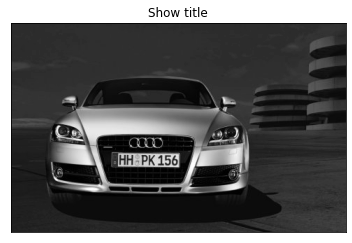

In [8]:
def show(car_image, title = "Show title"):
    """visualizing an image given as 'car_image' parameter, with respective title given in 'title' parameter"""
    # plt.figure(figsize=(15,11))
    plt.imshow(car_image, cmap = "gray")
    plt.xticks([]), plt.yticks([])
    plt.title(title)
    plt.show()
    
# let's try it immediately :)
show(car_image)

Let's explore the read image a bit: its type, min and max values, shape...

In [9]:
car_image.dtype, car_image.min(), car_image.max(), car_image.shape

(dtype('float64'), 0.0, 1.0, (300, 479))

To use the CCL (connected-component labeling) also called CCA (connected-component analysis) method we need to insert a binary image. Using Sobel threshold is not suitable in this case as it doesn't split the images on 0 and 1 (binary) values. Therefore, to create a binary image out of the grayscaled car_image, we can use the Otsu's method.

In [10]:
def binary_image(input_image):
    """
    using Otsu's method the input image is transformed in binary values (image consisting of only 0)
    """
    threshold_value = filters.threshold_otsu(input_image)
    binary_image = input_image >= threshold_value  # used when you apply Otsu filter
    assert_equal(len(np.unique(binary_image)), 2)
    return binary_image

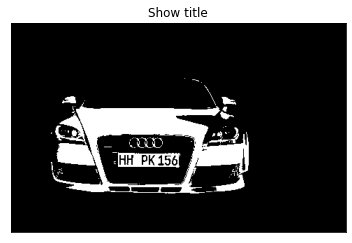

In [11]:
binary_car_image = binary_image(car_image)
show(binary_car_image)

We need to identify all the connected regions in the image, using the concept of connected component analysis. Other approaches like edge detection and morphological processing can also be explored. CCA basically helps us group and label connected regions on the foreground. A pixel is deemed to be connected to another if they both have the same value and are adjacent to each other.

We used the `patches.Rectangle` method to draw a rectangle over all the mapped regions.
From the resulting image, we can see that other regions that do not contain the license plate are also mapped. In order to eliminate these, we will use some characteristics of a typical license plate to remove them.
1. They are rectangular in shape.
2. The width (`shape[0]`) is more than the height (`shape[1]`).
3. The proportion of the width of the license plate region to the full image ranges between 15% and 40%.
4. The proportion of the height of the license plate region to the full image is between 8% & 20% for rectangular plate with characters split on two rows (plate_dimentions2 or "dimension type 2") and between 3% & 8% for standard plate (plate_dimentions or "dimension type 1")

In [12]:
#######################################################
# Method 1 - Connected Component Analysis using skimage
#######################################################
def detect_plate_CCA(gray_image, binary_image, plates=None):
    """
    detecting plate function using as entry parameters a grayscaled/coloured image and a binary reprentation of that image
    
    side effect output: visualization of entry grayscaled/coloured image with detected plate area, if detected, 
                        or title "Unrecognised car lisence plate region", if not detected
    return: list of plate cropped from the input grayscaled/coloured image
    """
    # this gets all the connected regions and groups them together. Required by measure.regionprops
    label_image = measure.label(binary_image)

    # standard shape
    plate_dimensions1 = (0.03*label_image.shape[0], 0.08*label_image.shape[0], 0.15*label_image.shape[1], 0.4*label_image.shape[1])
    # plates with two rows
    plate_dimensions2 = (0.08*label_image.shape[0], 0.2*label_image.shape[0], 0.15*label_image.shape[1], 0.4*label_image.shape[1])

    plate_dimensions = [plate_dimensions1, plate_dimensions2]

    plate_objects_cordinates = []
    plate_like_objects = plates if plates else []

    # Drawing the image
    fig, (ax1) = plt.subplots(1)
    ax1.imshow(gray_image, cmap="gray")

    discovered, plate_iteration_i = False, 0
    while not discovered and plate_iteration_i < len(plate_dimensions):
        plate_iteration_i += 1
        min_height, max_height, min_width, max_width = plate_dimensions[plate_iteration_i - 1]

        for region in measure.regionprops(label_image):

            if region.area < 50:  # Number of pixels of the region
                continue

            min_row, min_col, max_row, max_col = region.bbox  # Bounding box (min_row, min_col, max_row, max_col). Pixels 
            # belonging to the bounding box are in the half-open interval [min_row; max_row) and [min_col; max_col)

            region_height = max_row - min_row  # calculate the height of the region
            region_width = max_col - min_col  # calculate the width of the region

            if region_height >= min_height and region_height <= max_height and region_width >= min_width \
            and region_width <= max_width and region_width > region_height:
                discovered = True
                # Select the region from min_row to max_row and min_col to max_col from the original binary edge_image
                plate_like_objects.append(gray_image[min_row:max_row, min_col:max_col])
                plate_objects_cordinates.append((min_row, min_col, max_row, max_col))

                # Drawing the boundry box around the found plate
                rectBorder = patches.Rectangle((min_col, min_row), region_width, region_height, edgecolor="red",
                                               linewidth=3, fill=False)
                ax1.add_patch(rectBorder)



    if not discovered:
        plt.title("Unrecognised car lisence plate region")
    else:
        plt.title(f"plate found, dimension type - {plate_iteration_i}")
    plt.xticks([]), plt.yticks([])
    plt.show()
    
    return plate_like_objects

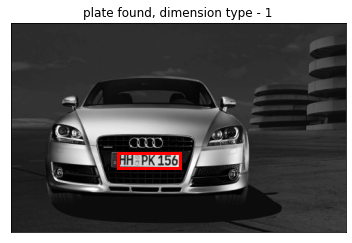

In [13]:
plates = detect_plate_CCA(car_image, binary_car_image)

While relatively good on set of images with predefined position of the car, background and size of the image, on a dataset of images where these are not adjusted in advance the success rate of the approach above is approx. 5% - 10%. Of course this can be improved a bit by increasing the number of plates dimensions in `plate_dimensions` variable used inside this function. In the current function, I have used only the most advised and presented plate dimension available on Internet.

Second appoach uses for simplicity the powerful OpenCV module. As explaned before it uses an edge extraction via Sobel kernel.

But first, it is crutial to mention that OpenCV requires different image format. Thus, there is a need of a function that transfers the images read initially with `skimage` as `numpy` array of `dtype('float64')` (built-in value of float in Python) to OpenCV format which is again `numpy` array but this time of type `dtype('uint8')` - unsigned integer (0 to 255). Naturally its name will be `skimage_to_openCV`:

In [14]:
def skimage_to_openCV(image):
    """imput image is transferred from dtype('float64') to dtype('uint8') numpy ndarray which is OpenCV format"""
    return util.img_as_ubyte(image)

In [15]:
car_image_cv_formatted = skimage_to_openCV(car_image)

In [16]:
assert car_image_cv_formatted.dtype == "uint8"

After creating it and checking its format type, we can incorporate this function for simplicity into another function representing the second method in two steps:

1. locate all the possible contours - for that a separate function `locate_contour` is created

In [17]:
##############################################################
#   Method 2 - using OpenCV 4.0 module
##############################################################
def locate_contours(gray, keep = 10, show=False):
    """
    locating contours of an image function after several transformation of the input picture
    params: gray: grayscaled input image in OpenCV format; keep: number of contours to be returned, default=10;
            show: option to visualize the transformation done on the image, default=False
    return: list of contours found on the transformed image using CCA of OpenCV
    """
    # perform blackhat morph operation - it will show us the text in white on black background
    rectKern = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 5))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKern)
    if show:
        cv2.imshow("Blackhat", blackhat)
        cv2.waitKey(0)
    # next, find regions in the image that are light
    squareKern = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    light = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, squareKern)
    light = cv2.threshold(light, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    if show:
        cv2.imshow("Light regions", light)
        cv2.waitKey(0)
    
    # Using cv2.Sobel, we compute the Scharr gradient representation of the blackhat
    # image in the x-direction and then scale the result back to the range [0, 255]
    gradX = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
    gradX = np.absolute(gradX)
    # we scale the range back to [0, 255]
    (minVal, maxVal) = (np.min(gradX), np.max(gradX))
    gradX = 255 * ((gradX - minVal) / (maxVal - minVal))
    gradX = gradX.astype("uint8")
    if show:
        cv2.imshow("Scharr", gradX)
        cv2.waitKey(0)
    
    # blur the gradient representation, applying a closing operation, and threshold the image using Otsu's method
    gradX = cv2.GaussianBlur(gradX, (5, 5), 0)
    gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKern)
    _, thresh = cv2.threshold(gradX, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    if show:
        cv2.imshow("Grad Thresh", thresh)
        cv2.waitKey(0)
    
    # to eliminate any still big white regions we do another series of morph operations:
    # a series of erosions and dilations to clean up the thresholded image
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=2)
    
    # take the bitwise AND between the threshold result and the
    # light regions of the image
    thresh = cv2.bitwise_and(thresh, thresh, mask=light)
    thresh = cv2.dilate(thresh, None, iterations=2)
    thresh = cv2.erode(thresh, None, iterations=1)
    if show:
        cv2.imshow("Last", thresh)
        cv2.waitKey(0)
    
    # find contours in the thresholded image and sort them by
    # their size in descending order, keeping only the largest ones
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[:keep]
    # return the list of contours
    cv2.destroyAllWindows()
    return cnts

2. To use this function properly, another function will be made as first version of presentation of this method, named `detect_plate_cv1`. It is going to return the contours that correspond to specific requirement of ratio only:

In [18]:
def detect_plate_cv1(gray_image, plates=None, show=False):
    """
    detecting plate function using as input parameters a grayscaled image read via skimage called `gray_image`
    parameters: gray_image: grayscaled image as read using skimage.io module;
                plates: the list of discovered plates to which the newly found plate will be appended, default = None;
                show: option for showing the transformations done of the picture before selcting the plate, default=False
    side effect output: visualization of car_image transformation, if `show` set to `True` 
    return: None if not license plate found or if license plate found and `plates` given as input parameter:
            - list with added on the last position the cropped image of the dicovered license plate to the list `plates` 
            - or list containing only the cropped license plate from the image
    """
    gray_image_cv_formatted = skimage_to_openCV(gray_image)
    contours = locate_contours(gray_image_cv_formatted, show = show)
    
    plate_like_objects = plates if plates else []
    plateContour = None

    for c in contours:
        (x, y, w, h) = cv2.boundingRect(c)
        ratio = w / float(h)
        # check to see if the aspect ratio is rectangular
        if ratio >= 2 and ratio <= 7:
            # extract the license plate from the grayscale image 
            plate_like_objects.append(gray_image[y:y + h, x:x + w])
            return plate_like_objects

There was another method <a href="https://www.codespeedy.com/license-plate-recognition-using-opencv-in-python/">available on Internet</a> where main difference is in the way the picture is extracted. Instead of direct Sobel application it uses Canny edge detection incorporated in OpenCV, which includes in its algorithm itself the application of Sobel edge detection.

To visualize a bit what I am talking about for so long, when using the term "Sobel edge detection" or briefly "Sobel", I will show the results on our demo image after applying Sobel using `skimage` here below:

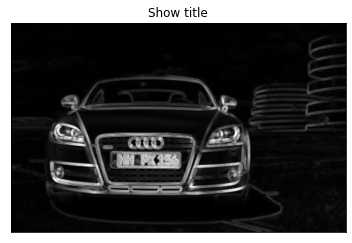

In [19]:
edged_image = filters.sobel(car_image)
edged_image = morphology.dilation(edged_image)
show(edged_image)

This second method found on Internet is replicated in the function `detect_plate_cv2` in the next cell:

In [20]:
##############################################################
#   Method 2 - using OpenCV 4.0 module
##############################################################
def detect_plate_cv2(gray_image, plates=None):
    """
    detecting plate function using as entry parameters a grayscaled image read via skimage
    parameters: gray_image: grayscaled image as read using skimage.io module;
                plates: the list of discovered plates to which the newly found plate will be appended, default = None
    side effect output: visualization of entry grayscaled image with detected plate area, if detected, 
                        or sign "Unrecognised car lisence plate region", if not detected
    return: list of images of plates cropped from the input grayscaled image
    """
    gray_image_cv_formatted = skimage_to_openCV(gray_image)
    
    gray = cv2.bilateralFilter(gray_image_cv_formatted, 13, 15, 15) 
    edged = cv2.Canny(gray, 30, 200)
    
    plate_like_objects = []
    if plates is not None:
        plate_like_objects = plates

    items = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # contours = imutils.grab_contours(items)  # using imutils.grab_contours, or I'd better use the line below
    contours = items[0] if len(items) == 2 else items[1]
    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]  # selecting top 10 contours onlyby area size
    plateContour = None
   
    for c in contours:
        # approximate the contour
        peri = cv2.arcLength(c, True)
        approx = cv2.approxPolyDP(c, 0.018 * peri, True)
        # if our approximated contour has four points, then
        # we can assume that we have found our screen
        if len(approx) == 4:
            plateContour = approx # it will provide witht the four points - coordinates
            coord_top, coord_bottom = plateContour[0], plateContour[2]
            (top_y, top_x), (bottom_y, bottom_x) = coord_top[0], coord_bottom[0]
            plate_like_objects.append(gray_image[top_x: bottom_x + 1, top_y : bottom_y  + 1])
            return plate_like_objects

    if plateContour is None:
        return show(gray_image, "Unrecognised car lisence plate region")

Using OpenCV, it is also is possible to place the contour found on the existing original image, just like I did when using `skimage` module in `detect_plate_CCA` here by using the following code:

In [21]:
# cv2.drawContours(gray_image, [plateContour], -1, (0, 0, 255), 1) 
# show(gray_image, "Original with tiny contour placed")

# we can mask everything but the plate and return it that way
# mask = np.zeros(gray_image.shape, np.uint8)  # creating a completely black mask with the shape of the image
# new_image = cv2.drawContours(mask, [plateContour], 0, 255, -1,)  # draw the contour in the mask matrix using the box sizes
#                     # and position passed as list out of the cv2.boxPoints function, third argument is index of contours
#                     # 0 means the first contour. 255 is the colour, -1 is the thickness
# new_image = cv2.bitwise_and(gray_image, gray_image, mask=mask)  # applying the mask using logical AND

# show(new_image)

# (x, y) = np.where(mask > 10)  # the coordinates are defined where it is not covered in black [0] by mask
# (topx, topy) = (np.min(x), np.min(y))  # top left corner coordinates
# (bottomx, bottomy) = (np.max(x), np.max(y))  # bottom right corner coordinates
# Cropped = gray_image[topx:bottomx+1, topy:bottomy+1]

# show(Cropped)

But we just need the area of the picture which was discovered on the original grayscaled picture. Let's visualize what we have found using both functions:

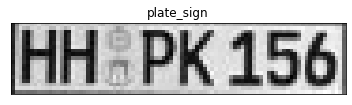

In [22]:
plates = detect_plate_cv1(car_image, show=True)
show(plates[0], "plate_sign")

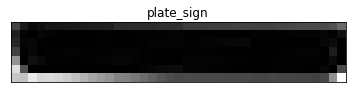

In [23]:
plates_2 = detect_plate_cv2(car_image)
show(plates_2[0], "plate_sign")

For this particular image, the method where we apply numerous morphology operation, including Otsu and Sobel, and search for contours only after that deals better with correct contour selection. Unfortunately, just like in first method (with `skimage` module), its success rate on dataset of images which are not pre-adjusted in advance in terms of size, background and position of the car in the image is not good at all. The success rate is even below the method withoud using openCV. Still, as OpenCV module is very good in processing videos, the methods described above can be use there, as with videos, it is more likely that an approaching or moving away vehicle, the size in the plate fits well with the required process to be successful.

That is why again, to compare the results of this code with the possibility of a humans without using some CNN or DL algorithms is really hard.

***III.*** **Character segmentation**

 At this stage the easiest way would be to save this image and apply tesseract library.
 I could just open a new terminal in the `output` folder and write:

```tesseract [path to image] [text file name]```

 All I'll need to do afterwards would be to read the file, just like we did in `Working with Images and Text Lab` during the Data Science course.

 But, let's try to apply Machine Learning models instead. During this process, the number plate character is split repeatedly until every character is separated into individual sub-image. This phase is important in any LPR system as each segmented characters will determine the rate of character recognition accuracy. If the segmentation of a license plate fails, the result will cause a character to be divided improperly, or two characters to be mistakenly merged as one segmented character. There are some cases where the license plate extracted from the localisation step have some problems such as dots, tilting, stains on plates and different illumination condition across the license plate. For example, unwanted stains that are present on the license plate might cause the system to mistakenly recognise it as characters which lead to recognition error. However, these problems can be easily solved by applying preprocessing processes such as mathematical morphology and vertical edge projection histogram.
 
 As mentioned there are two preprocessing techniques used to enhance extracted license plate before character segmentation: mathematical morphology and vertical edge projection histogram segmentation. Mathematical morphology is used to remove stains and dirt on the license plate. It is not computationally complex. The vertical edge projection histogram segmentation is used to remove larger unwanted elements such as border stains. It is a method with a combination of fill-in and connecting labelled component for border removal and character segmentation. An aspect ratio of the border could be used in order to differentiate characters from borders to avoid false removal of characters component. However, this character segmentation method is only useful for license plate containing borders. 

 As for character segmentation it can be done in two ways: either by using the histogram projection method, or by finding rectangle regions in the extracted license plate. Both algorithm involves binarisation. While the first method consist in simple pixel summation, the second requires contours finding on the extracted license plate before detecting the rectangle region. Each individual contour is bounded with a rectangular bounding box as a region. Then, it is analysed under a certain aspect ratio and only detected region that meets some criterion is kept for character recognition, while the rest is removed. This makes it a bit more robust in case some additional signs different that characters are available on the plate, and also in the case of other stains.  

 So, at this stage we should have already our license plate cropped area as separate image. As explained above there should be some morphology operations applied on it in order to remove small disturbances if any.

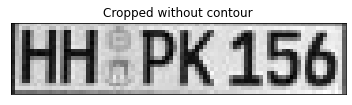

In [24]:
Cropped = plates[0]
#Cropped[Cropped == 0] = 1 # remove the contour of the bounding box
show(Cropped, "Cropped without contour")
# Cropped = morphology.erosion(Cropped)
# show(Cropped, "after erosion")
# Cropped = morphology.dilation(Cropped)
# show(Cropped, "after dilation")

Most of the case we do not have ideal (in terms of straight lines or rotation) extracted plate number and there is some skew in the image. There are two ways to correct this (3 if we include the angle that we can get using OpenCV function `cv2.minAreaRect()`). One way is using the "Projection profile method" (vertical histogram) with the <a href="https://avilpage.com/2016/11/detect-correct-skew-images-python.html">following code</a>. Same code is replicated below. Here I set as limit in the skew of +/- 15 degrees.

In [25]:
def deskew_using_vert_hist(input_data, delta = 1, limit = 15):
    """
    deskewing the input image based on the maximum vertical histogram profile projection
    params: input_data: input grayscaled image; delta: the degree step for check, default = 1 degree;
            limit: the limit angle of rotation (degree), default = 15 degree;
    return: the grayscaled image rotated with the best angle found using scipy.ndimage.interpolation imported as inter
    """
    def find_score(arr, angle):
        data = inter.rotate(arr, angle, reshape=False, order=0)
        hist = np.sum(data, axis=1)
        score = np.sum((hist[1:] - hist[:-1]) ** 2)
        return hist, score

    angles = np.arange(-limit, limit+delta, delta)
    scores = []
    for angle in angles:
        hist, score = find_score(input_data, angle)
        scores.append(score)

    best_score = max(scores)
    best_angle = angles[scores.index(best_score)]
    print('Best angle: {}'.format(best_angle))

    # return corrected skew
    return inter.rotate(input_data, best_angle, reshape=False, order=0)

After creating the function, it is time to apply it and visualize the result. The result will be saved in temporary parameter `tmp.`

Best angle: 1


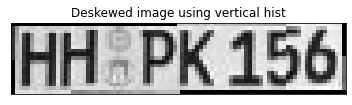

In [26]:
tmp = deskew_using_vert_hist(Cropped)

show(tmp, "Deskewed image using vertical hist")

There is second way to correct the skew as I mentioned and it is presented in the cell below. It uses Hough transform with OpenCV found on gitHub:

In [27]:
# def deskew_using_Hough_transform(tmp):    
#     rows, cols = tmp.shape
    
#     minLineLength = cols / 2.0
#     maxLineGap = 20
#     lines = cv2.HoughLinesP(tmp, 1, np.pi/180, 100, minLineLength, maxLineGap)
    
#     #calculate the angle between each line and the horizontal line:
#     angle = 0.0
#     nb_lines = len(lines)
    
#     for line in lines:
#         angle += math.atan2(line[0][3]*1.0 - line[0][1]*1.0,line[0][2]*1.0 - line[0][0]*1.0);
    
#     angle /= nb_lines * 1.0
#     angle *= (180.0 / np.pi)
    
#     #compute the minimum bounding box:
#     non_zero_pixels = cv2.findNonZero(tmp)
#     center, wh, theta = cv2.minAreaRect(non_zero_pixels)
    
#     root_mat = cv2.getRotationMatrix2D(center, angle, 1)
    
#     rotated = cv2.warpAffine(tmp, root_mat, (cols, rows), flags=cv2.INTER_CUBIC)

#     #Border removing:
#     sizex = np.int0(wh[0])
#     sizey = np.int0(wh[1])
#     print theta
#     if theta > -45 :
#         temp = sizex
#         sizex = sizey
#         sizey = temp
#     return cv2.getRectSubPix(rotated, (sizey,sizex), center)

The Hough transform is bit more complicated both as concept and as coding even when using the OpenCV module. So I won't use it here. The code above is mainly for information on how we could implement it.

For the next step towards segmenting the characters out of the license plate, we have the possibility to choose between two concepts:

1. concept of applying the histogram of pixel projection
2. use again the concept of connected component analysis

First thing first, so let's start with small explanation of the concept of the histogram protection.

This concept is in fact possible, as after transforming the deskewed plate to a binary image, we can calculate for each row and for each column the number of the pixels that differs. (we should not forget that here the beginning of a picture, thus the (0, 0) position, is on the top left corner of the image). The next cell's outcome visualize all I want to explain much better:

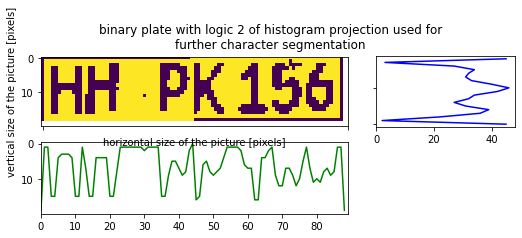

In [28]:
thres_tmp = filters.threshold_otsu(tmp)
binary_tmp = tmp >= thres_tmp  # used when you apply Otsu filter

# Vertical projection is nothing but the column wise sum of all the elements in each row of the image.
img_col_sums = np.sum(binary_tmp , axis = 0)
# logic 2: If the img has foreground pixel as black i.e pixel value = 0
vertical_hist = binary_tmp.shape[0] - np.sum(binary_tmp, axis = 0)
horizontal_hist = binary_tmp.shape[1] - np.sum(binary_tmp , axis = 1)

fig = plt.figure(figsize=(8.5, 4.5))
grid = plt.GridSpec(3, 3)
x_hist = fig.add_subplot(grid[0, 2], yticklabels=[])
y_hist = fig.add_subplot(grid[1, 0:2], xlim = (0, tmp.shape[1]))
main_ax = fig.add_subplot(grid[0, 0:2], xticklabels=[], sharey=y_hist)

main_ax.imshow(binary_tmp)
# y_hist.plot(img_col_sums, color = 'r')
y_hist.plot(vertical_hist, color = 'g')
x_hist.plot(horizontal_hist, [y for y in range(len(horizontal_hist))][::-1], color = 'b')
plt.xticks([0, 90])
plt.xlabel("horizontal size of the picture [pixels]")
plt.ylabel("vertical size of the picture [pixels]", horizontalalignment='center')
plt.suptitle("binary plate with logic 2 of histogram projection used for\nfurther character segmentation")
plt.show()

 We have to take in consideration that ideally we should be able to segment plates that are positioned on two rows as well. This is the case for all motors and scooters and not a small portion of other type of vehicle's plates.

So, more technically speaking, we'd better start with the horizontal split of the picture. We accept that the height of a character on the plate cannot be less than 30% - 35% of the height of the plate. And as there are max characters on a row their histogram level should be at least at the level of 1/3 of maximum hist value per row. Everything below that level should be considered as noise.

After cutting the image in rows, let's assume some limits concerning the height of a letter or number. According to different fonts, we can expect that the minimum value of vertical histogam would be where there is a single line of a character, meaning it would be equal to a horizontal line segment (stroke) of a letter. That stroke value should be not less than 16% of the height of a letter, with some tolerance of 6% we can assume that 15% of the max histogram value (where we have a vertical stroke of a letter from top to bottom) should equal the threshold. Same threshold will be applied as our minimum character width.

I have put all that in the function `segmentation_via_histogram_of_pixel_projection`:

In [29]:
def segmentation_via_histogram_of_pixel_projection(tmp):
    """
    function to segment characters from image using the concept of histograms of pixel projection
    params: tmp: cropped area of license plate in grayscaled format
    return: list of binary images of segmented characters along with printed statement about the number of characters 
            in that list or None if unsucessfull segmentation (less than 3 segments is considered unsuccessfull segmentation)
    """
    height, width = tmp.shape
    
    # define standard width and height of character
    digit_w, digit_h = 20, 20
    
    # transform the image in binary using Otsu
    blur = filters.gaussian(tmp, sigma=0.5)
    thres_tmp = filters.threshold_otsu(blur)
    binary_tmp = blur >= thres_tmp  # used when you apply Otsu filter

    # calculating the horizontal histogram first
    vertical_hist = binary_tmp.shape[0] - np.sum(binary_tmp, axis = 0)
    horizontal_hist = binary_tmp.shape[1] - np.sum(binary_tmp , axis = 1)
    
    horizontal_hist[horizontal_hist >= binary_tmp.shape[1] * 0.9] = 0  # removing the black lines taking more than 90% of a row
    
    min_letter_height = int(height * 0.35)
    min_hor_hist_value = max(horizontal_hist) / 3

    def consecutive(data, stepsize=1):
        """Return list of consecutive lists of numbers from data (index list)."""
        return np.split(data, np.where(np.diff(data) > stepsize)[0] + 1)
    
    # horizontal split first
    rows_in_plate = []

    hor_result = np.where(horizontal_hist > min_hor_hist_value)
    hor_result = consecutive(*hor_result)
    for h_element in hor_result:
        if len(h_element) > min_letter_height:
            start = h_element[0] - 1 if h_element[0] != 0 else h_element[0]
            end = h_element[-1] + 1
            rows_in_plate.append(binary_tmp[start: end, :])
            
    # vertical split second for each row
    characters = []
    for row in rows_in_plate:
        vertical_hist = row.shape[0] - np.sum(row, axis = 0)

        min_vert_hist_value = int(max(vertical_hist) * 0.12)

        vert_result = np.where(vertical_hist > min_vert_hist_value)
        vert_result = consecutive(*vert_result)

        temp_list = []
        for v_element in vert_result:
            if not any(v_element) or (v_element[0] == 0) or (v_element[-1] == row.shape[1] - 1):
                continue
            if len(v_element) >= min_vert_hist_value:
                char = row[:, v_element[0]: v_element[-1] + 1]
                temp_list.append(char)
        if not temp_list:
            return
        chars_widths = [char.shape[1] for char in temp_list]
        max_char_width = max(chars_widths)  # find max width for all discovered chars
        # for the difference inwidth to the chars
        diff_char_width = [max_char_width - char_width if max_char_width - char_width > 0 else 0 for char_width in chars_widths ]
        
        x = np.ones((row.shape[0], 1))  # create the column to pad
        for i, diff in enumerate(diff_char_width):
            while diff > 0: # padding
                temp_list[i] = np.append(temp_list[i], x, axis = 1) if diff % 2 == 0 else np.append(x, temp_list[i], axis = 1)
                diff -= 1

        # resize to the required size in order to correspond to the image size the model will be trained
        for char in temp_list:
            char = transform.resize(char, (digit_h, digit_w), preserve_range=True, anti_aliasing=False)
            char[char >= 0.7] = 1
            char[char < 0.7] = 0
            characters.append(char.astype('bool'))  
    
    if len(characters) > 3 and len(characters) < 15:
        print(f"Detected {len(characters)} letters...")
        return characters
    return

In [30]:
# executing the function
chars = segmentation_via_histogram_of_pixel_projection(tmp)

Detected 7 letters...


I will create small function that plot the found characters with the name `show_chars`:

In [31]:
def show_chars(found_chars):
    """function that plot the found characters, accepting as entry parameter the list of found characters"""
    fig, ax = plt.subplots(1, range(len(found_chars))[-1] + 1, figsize=(10,3), sharex=True)

    for i in range(len(found_chars)):
        ax[i].imshow(found_chars[i],cmap="gray")
        ax[i].set_axis_off()

    plt.tight_layout()
    plt.show()

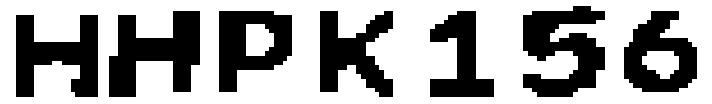

In [32]:
show_chars(chars)

[Source: https://medium.com/towards-artificial-intelligence/image-processing-basics-through-opencv-e9cbc6130821 ]

[Source: https://towardsdatascience.com/segmentation-in-ocr-10de176cf373 ]

[Source: https://towardsdatascience.com/automatic-license-plate-detection-recognition-using-deep-learning-624def07eaaf]


Of course, we can use the second concept, which in the code below uses OpenCV's CCA as shown in <a href="https://medium.com/@quangnhatnguyenle/detect-and-recognize-vehicles-license-plate-with-machine-learning-and-python-part-2-plate-de644de9849f">"Detect and Recognize Vehicle’s License Plate with Machine Learning and Python — Part 2: Plate character segmentation with OpenCV"</a> by Quang Nguyen with small improvements from my side.

In [33]:
def segmentation_via_opencv_and_cca(tmp, show_steps=False):
    """
    function that segments charaters from a license plate image using the concept of connected component analysis via OpenCV
    params: tmp: cropped area of license plate
            show_steps: bool, default = False; if True show the transformation of the image on each step using OpenCV imshow
    return: list of binary images of segmented characters along with printed statement about the number of characters 
            in that list or None in case of unsuccessful segmentation (if less than 3 segments found)
    """
    # Applied inversed thresh_binary using Otsu threshold (180 is the value used to classify the pixel values, 
    # 255 = maxVal to be given if bigger that threshold values)
    _, binary = cv2.threshold(util.img_as_ubyte(tmp), 180, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) 

    # Apply dilation 
    kernel_of_size_3 = np.ones((3,3), np.uint8)
    thre_mor = cv2.morphologyEx(binary, cv2.MORPH_DILATE, kernel_of_size_3)
    if show_steps:
        cv2.imshow("thre_mor", thre_mor)
        cv2.waitKey(0)
    
    thre_mor_2 = cv2.morphologyEx(thre_mor, cv2.MORPH_ERODE, kernel_of_size_3)
    if show_steps:
        cv2.imshow("thre_mor_2", thre_mor)
        cv2.waitKey(0)
    
    # Create sort_contours() function to grab the contour of each digit from left to right
    def sort_contours(cnts, reverse = False):
        i = 0
        boundingBoxes = [cv2.boundingRect(c) for c in cnts]
        (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes), key=lambda b: b[1][i], reverse=reverse))
        return cnts

    cont, _  = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # create a copy version "test_roi" of plate_image to draw bounding box
    test_roi = tmp.copy()
    if show_steps:
        cv2.imshow("test_roi", test_roi)
        cv2.waitKey(0)

    # Initialize a list which will be used to append charater image
    crop_characters = []

    # define standard width and height of character
    digit_w, digit_h = 20, 20  # in order to correspond to the image size the model will be trained

    for c in sort_contours(cont):
        (x, y, w, h) = cv2.boundingRect(c)
        ratio = h / w
        if 1 <= ratio <= 3.5: # Only select contour with defined ratio (3.5 for normal letters, 8 for I not available in the dataset for modelling)
            if h / tmp.shape[0] >= 0.5: # Select contour which has the height larger than 50% of the plate
                # Draw bounding box arroung digit number
                cv2.rectangle(test_roi, (x, y), (x + w, y + h), (0, 255,0), 2)

                # Sperate number and give prediction
                curr_num = thre_mor_2[y:y+h, x:x+w]
                if show_steps:
                    cv2.imshow("curr_num1", curr_num)
                    cv2.waitKey(0)
                curr_num = cv2.resize(curr_num, dsize=(digit_w, digit_h))
                if show_steps:
                    cv2.imshow("curr_num_resized", curr_num)
                    cv2.waitKey(0)
                _, curr_num = cv2.threshold(curr_num, 220, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
                if show_steps:
                    cv2.imshow("curr_num_final_thresholded", curr_num)
                    cv2.waitKey(0)
                    cv2.destroyAllWindows()
                #curr_num[curr_num == 255] = 1
                crop_characters.append(curr_num.astype('bool'))
    
    if len(crop_characters) > 3:
        print(f"Detected {len(crop_characters)} characters...")
        return crop_characters
    return

In [34]:
# executing the function
crop_characters = segmentation_via_opencv_and_cca(tmp, show_steps = True)

Detected 7 characters...


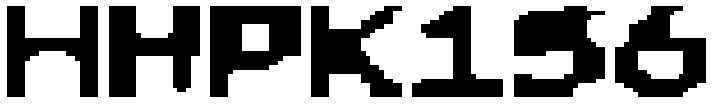

In [35]:
show_chars(crop_characters)

We have come quite a long way to get here. In fact big part of the LPR job is until the stage and if it fails until that moment, the whole process fail. In our case, I managed to have segmented plate in two different ways. Even if it is not done perfectly well, a really good model can overcome this problem and still recognise the correct characters. There are too many incertainties in the process until here, so that is why making the perfect choice of the ML model is really important. Only after that we can move to the step of character recognition.

***IV.*** **Training the model**

This segment of this notebook is a bit appart from the whole process of LPR, as it consists in training a model and pre-select the best one. It is something that generally should be made in advance, so to be applied immediately at the end of the character segmentation. But as the purpose of this notebook is to serve as final project in Machine Learning, in fact, this section is the main part as it involves Machine Learning knowledge.

After this phase, all the extracted characters from the segmentation step will undergo recognition process. Recent interests in LPR systems include sophisticated machine learning techniques (like deep learning, neural networks, SVMs) along with good plate localization and character segmentation algorithms.

Generally, CNNs have the ability to extract image features automatically, and generally perform better than other methods in terms of image classification. Despite that it is not in the scope of the current project, since the idea is to present an efficient way of choosing the most convenient ML model serving for the task of character recognition and consequently learning this model with correct hyperparameters. Therefore, I prefer to concentrate on SVM, KNN and ANN with 1 hidden layer over Tesseract OCR, hidden Markov models or other Deep NN (requiring huge number of training data to achieve high accuracy), despite it can be much more time consuming.


The explanation of these preffered models and the logic behind these preliminary choices of training models is the following:

In our case there is classification problem, or to be more precise multi-label classification problem. Using one-vs-all (one-vs-rest) classification we can also use Logistic Regression model for our task, but instead I will use a Linear SVM (without kernel) as it maximize the margin between the different classes. Due to my expectations of non-linearity in the data, using SVM with different kernel is an option I would like to explore and the most used option (one that usually ML Engeneers starts with as it is the most "multifunctional" model) is SVM with the Gaussian kernel.

K-Nearest Neighbours is considered as suitable option as well, as it is robust to noisy data, which I expect to receive as outcome from the character segmentation described in Section III. Of course, with kNN the data is simply stored and is most effective if the training data is large. Unfortunately, it consequently tends to create a very large model as well (in terms of size). 

Fully Connected Neural Network (ANN - Artificial Neural Network) training is another option I would like to explore. Training of such ANN should start with a 1-hidden layer version. This layer has biggest importance if parametrized correctly. It is possible to add additional layers which will improve further the quality of the predictions, especially in case of non-linearity in the data. Generally, ANNs are prone to overfitting when the parameters are too many. In that case they become also computationally more expensive. Nevertheless, ANNs are spreadly used in letter recognition and it is worth comparing their results here.


To train a model we need correct dataset with images of all possible characters. After a research, I found 2 different datasets. The first one is a simple one, that consist of digits and letters (without 'I' and 'O', as they can be easily confused and sometimes are written the same way). This makes this dataset unapplicable in countries where these letters can be found on the plates with their concrete (different) meanings. This first set has for each letter/digit 10 observations representing the sign on a white backgroud with different colours and fonts:

| | | | | |
|-|-|-|-|-|
|     |  | | |  | 
| | |  | |


Unfortunately, this is quite small dataset and the number of observations is not enough to use part of them for training. Moreover, here we have images of 20x20 pixels which defines the number of features at 400. If we add to them the color feature, it will become too much. To avoid this and keep the number of features I will transfer all the images to binary mode. Still, with 34 target labels for this dataset the number of training exmaples remain smaller than the number of features. Unfortunately, I can't apply PCA on them, as it won't help much. Every single pixel matters here. Therefore, the strategy of training the model and the results might be different - the danger of overfitting is bigger. In such cases generally it is recommended to use more simple, linear models.

Having in mind the white background of this smaller dataset both methods for segmenting the characters above (`segmentation_via_histogram_of_pixel_projection` and `segmentation_via_opencv_and_cca`) fit perfectly. In both of these functions, I have normalised the segmented characters on purpose into 20x20 images. In fact, this is better to be done with both datasets as well before feeding them into the training network.

The second dataset consists of 500 observations per letter/digit. In this dataset, we do not have any missing letters. Another difference is that here the letters are of size 28x28, but this problem can be easily overcome by removing the surrounding 4 pixels, as in this dataset there is no danger of cutting, cropping or harming in any way the actual signs inside. The last think that should be taken in consideration when loading this dataset is that the signs here are white on a black background. As they are binary images, they just need to be inversed. There are no colored options: 

| | | | | |
|-|-|-|-|-|
| | |  | | 
| | || |

With this second dataset there are enough observations that will allow the test and train split. Generally it is recommended to do a 60: 20: 20 split of train, cross-validation and test split. Despite that, in order to keep as high as possible number of test data, I will use the default split of 70: 30. I will use this split as part of the learning strategy for this dataset.

By the way, it exists the possibility to "concatenate" both datasets once the images of each are aligned to same format. Still, this option is not explored below, as I assume that bigger dataset (50x bigger) would probably possess similar images to those in smaller dataset.

For both datasets I need a function, so that each character is extracted and set to `image_data` parameter and all labels to `target_data` parameter. The name of this function will be `read_training_data` and it will accept one important parameter: a flag defining which of the dataset will be used (small or bigger set). The directory path where the images of the dataset are based will be hardcoded.

In [36]:
# first we need to import the training data and set respective labels/target for them
def read_data(bigger_set=False):
    """
    reads dataset of images, and returns a tuple of matrix of those images and vector with labels corresponding to each image
    params:       bigger_set: bool, default = False; defines which dataset to be used. The folder's paths are hardcoded.
    return:       tuple of matrix with flatten binary images and vector with respective labels; both as numpy arrays.
    side effects: information of the time taken to create the matrices, information of their sizes.
    """
    print('reading data...', end='')
  
    labels = ([
            '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D',
            'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T',
            'U', 'V', 'W', 'X', 'Y', 'Z'
        ], [
            '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D',
            'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R',
            'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z'
        ])
    image_data = []
    target_data = []
    start, end, letters = 0, 10, labels[0]
    training_directory='data\\alphanum'
    if bigger_set:
        start, end = 1, 501
        letters = labels[1]
        training_directory = 'data\\dataset'
    
    begin = time()

    for each_letter in letters:
        for each in range(start, end):
            image_path = os.path.join(training_directory, each_letter, each_letter + '_' + str(each) + '.jpg')
            # print('reading each image of each character:', image_path)
            img_details = io.imread(image_path, as_gray=True)
            if bigger_set:
                binary_image = img_details <= filters.threshold_otsu(img_details)
                flat_bin_image = binary_image[4:-4, 4:-4].reshape(-1)
            else:
                binary_image = img_details > filters.threshold_otsu(img_details)
                flat_bin_image = binary_image.reshape(-1)
            image_data.append(flat_bin_image)
            target_data.append(each_letter)
    
    end = time()
    images, target = np.array(image_data), np.array(target_data)
    print('DONE!!!')
    print('time required for reading the dataset', end - begin, 'seconds')
    print(f'number of observations of the dataset: {images.shape[0]}; number of features: {images.shape[1]}')
    print(f'number of labels {target.shape[0]}')
    return (images, target)

The option of having two different datasets increase the curiosity on how much time it will need on my computer to read the datasets. The results are showing that for smaller dataset it requires aprox 30x less time than for the bigger one.

Before start using this function a decision which set to use first should be taken. As defined in the function this is done by setting the flag `bigger_set` to True or False, the smaller set being the default option. The next few lines provides the result on smaller dataset.

In [37]:
# loading smaller dataset
image_data, target_data = read_data()

reading data...DONE!!!
time required for reading the dataset 0.5461547374725342 seconds
number of observations of the dataset: 340; number of features: 400
number of labels 340


In [38]:
# define the first SVM - linear
linear_svm_classifier = LinearSVC(dual=False)  # Select the algorithm to either solve the dual or primal 
# optimization problem. Prefer dual=False when n_samples > n_features.

# define polynomial SVM
poly_svm_classifier = SVC(kernel = 'poly')  # if needed probability can be set to True

# define the second SVM - RBF kernel
gaussian_svm_classifier = SVC()  # if needed probability can be set to True

# ann
ann = MLPClassifier()

#knn
knn = KNeighborsClassifier()

Another important decision should be taken now, regarding the score based on which the comparison between models will be made. As we are talking about a Classification task when recognising the letters, the most suitable would be accuracy and f1-score, the second being recommended. This recommendation is valid when the distribution of classes is not even. Here, it is not the case. That is why I will use both scores, by keeping the default accuracy as the main one. For f1-score, I will use the option for multiclass targets `average` so that it calculates metrics for each label. 

For that purpose I have to use the `make_scorer` function from `sklearn.metrics` module.

In [39]:
# define the function for scoring
scoring = {'Accuracy': make_scorer(accuracy_score), 'f1': make_scorer(f1_score , average='macro')}

In order to avoid overfitting, what I can do on this stage is to make a GridSearchCV providing a list of parameter "C" which will help regularize the model. GridSearch will automatically check each of the parameters in the list, by using a CV split. I will keep the default cv-value of 5 folds that in GridSearchCV function is stratified. So, it is exactly what I need: 

In [40]:
# Use cross-validation to train and optimize the hyperparameters for a linear support vector machine.
params_linear = {
    "C": [0.003, 0.01, 0.03, 0.1, 0.5, 0.8, 1, 2]
}

# Save the grid results in grid_search
grid_search = GridSearchCV(linear_svm_classifier, params_linear, scoring = scoring, refit = 'Accuracy', return_train_score = True)

print('training model...')
grid_search.fit(image_data, target_data)

print("Linear SVM: best score:", grid_search.best_score_)

print("Linear SVM; best estimator:", grid_search.best_estimator_)
#linear_svm_classifier = grid_search.best_estimator_

model_linear_SVM = (grid_search.best_estimator_, grid_search.best_score_)

training model...
Linear SVM: best score: 0.9647058823529411
Linear SVM; best estimator: LinearSVC(C=0.03, dual=False)


What we got as best score is in fact the average of all cross_validation accuracy result of the best estimator:

In [41]:
lin_cv_gs = cross_validate(grid_search.best_estimator_, image_data, target_data, cv=5, scoring=scoring)
lin_cv_gs

{'fit_time': array([0.10277915, 0.11441803, 0.10042858, 0.09030247, 0.09243655]),
 'score_time': array([0.        , 0.00201941, 0.        , 0.00801778, 0.        ]),
 'test_Accuracy': array([0.95588235, 0.97058824, 0.95588235, 0.94117647, 1.        ]),
 'test_f1': array([0.95294118, 0.96960784, 0.95392157, 0.93823529, 1.        ])}

In [42]:
score_lin = np.mean(lin_cv_gs['test_Accuracy'])
score_lin

0.9647058823529411

It will be better to see what the accuracy on the whole train set (whole set) would be. For that purpose I will make a small function `display_scores` to be able to re-use it for all the models:

In [43]:
def display_scores(model, image_data = image_data, target_data = target_data):
    print(f"Train score:", model[0].score(image_data, target_data))
    print(f"CV best_score:", model[1])

In [44]:
display_scores(model_linear_SVM)

Train score: 1.0
CV best_score: 0.9647058823529411


Despite the applied regularization "C = 0.03", it seems the model overfits the data. The train score of 100% assume that it will be hard to generalize on new data that the model has not seen yet. This is going to be the case for the segmented characters. I can check it out, but before that, let's try other methods with respective regularisation and see what their scores will be.

The next option is the SVC with polynomial kernel. Even thoughit the dataset is not convenient for such model, as I expect to find some non-linearity, I won't throw this option still. Here, the most important parameter is "degree" which defines exactly how much of the non- linear data it can fit. The risk with increasing the "degree" is again of overfitting the data. Hopefully this can be compensated by the "C" parameter.

In [45]:
params_poly = {
    "C": [0.1, 1, 10, 15, 20, 30],
    "degree": [2, 3, 4, 5]
}

grid_search_poly = GridSearchCV(poly_svm_classifier, params_poly, scoring = scoring, refit = 'Accuracy', return_train_score = True)

print('Training model...')
grid_search_poly.fit(image_data, target_data)

print("Polynomial SVM; best score:", grid_search_poly.best_score_)

print("Polynomial SVM; best estimator:", grid_search_poly.best_estimator_)
#linear_svm_classifier = grid_search.best_estimator_

model_poly_SVM = (grid_search_poly.best_estimator_, grid_search_poly.best_score_)

Training model...
Polynomial SVM; best score: 0.9764705882352942
Polynomial SVM; best estimator: SVC(C=10, degree=2, kernel='poly')


In [46]:
display_scores(model_poly_SVM)

Train score: 1.0
CV best_score: 0.9764705882352942


As expected for dataset with less training examples than number of features, it will tend towards linear model - it gives the smallest possible degree function. The scores look pretty similar. Let's try something more reliable for such cases - SVC with Gaussian kernel. This model matches well with datasets of average size, where training examples' size is close to features' size. Having in mind its Gaussian kernel, the model is more sensitive to its "gamma" parameter. When "gamma" is very small, which would be the expected situation here as well, the model is too constrained and cannot capture the complexity or “shape” of the data. The region of influence of any selected support vector would include the whole training set. The resulting model will behave similarly to a linear model. Generally the recommended values for GridSearch are logarithmic with values from $10^{-3}$ to $10^3$. In this case, in order to save some time, I would cut the values bigger than 0.1 and add values on the other extreme. To add to this I will use a list of values of "C" bigger than 1. Let's check the results:

In [47]:
params_gaussian = {
    "C": [1, 10, 15, 20, 30],
    "gamma": [0.0001, 0.0008, 0.001, 0.01, 0.1]
}

grid_search_gaussian = GridSearchCV(gaussian_svm_classifier, params_gaussian, scoring = scoring, refit = 'Accuracy', return_train_score = True)

print('Training model...')
grid_search_gaussian.fit(image_data, target_data)

print("Gaussian SVM; best score:", grid_search_gaussian.best_score_)

print("Gaussian SVM; best estimator:", grid_search_gaussian.best_estimator_)
#linear_svm_classifier = grid_search.best_estimator_

model_gaussian_SVM = (grid_search_gaussian.best_estimator_, grid_search_gaussian.best_score_)

Training model...
Gaussian SVM; best score: 0.9823529411764707
Gaussian SVM; best estimator: SVC(C=15, gamma=0.0008)


In [48]:
display_scores(model_gaussian_SVM)

Train score: 1.0
CV best_score: 0.9823529411764707


I seems Gaussian kernel performing too good, not to overfit the data.

With the last lecture regarding the Neural Network, we know that we can construct a FCNN or Dense NN on sklearn very easy. What is of great importance here is to define the number of hidden layers. As I explaigned already I will start with defaulf value of hidden layers of 1. What is important now is the number of parameters of this layer. Bigger the size, better the estimator, increasing also the risk of overfitting. With the size of this layer the computational complexity also increase, thus the time required. I will make the grid search using logaritmic scales as for the hidden layer sizes, as for the regularizing parameter named "alpha" in `sklearn`...

In [49]:
params_ann = {
    'hidden_layer_sizes': [(10000, ), (1000, ), (100, )],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'max_iter': [1000],
}

grid_search_nn = GridSearchCV(ann, params_ann, scoring = scoring, refit = 'Accuracy', return_train_score = True)

print('Training model...')
grid_search_nn.fit(image_data, target_data)

print("ANN; best score:", grid_search_nn.best_score_)

print("ANN; best estimator:", grid_search_nn.best_estimator_)

model_fcnn = (grid_search_nn.best_estimator_, grid_search_nn.best_score_)

Training model...
ANN; best score: 0.9705882352941178
ANN; best estimator: MLPClassifier(alpha=0.1, max_iter=1000)


In [50]:
display_scores(model_fcnn)

Train score: 1.0
CV best_score: 0.9705882352941178


Of course, making a grid search on Dense Neural Network takes much more time than any of the SVMs.It was somehow expected to get to similar score results. Let's try something less complex as model. It should be the fastest as well: the k-Nearest Neighbour algorithm.

K-Nearest algorithm is not going to be trained the way the other models were. Here the 100% accuracy on the training set is normal, as the model in fact memorize it and use the comparison with the nearest neighbours to define the class of the test set examples. Here, the important parameter is the number of neighbours - the bigger the size, the more computational complexity.

In [51]:
params_knn = {
    "n_neighbors": [3, 5, 9, 11, 13, 17, 19],
}

grid_search_knn = GridSearchCV(knn, params_knn, scoring = scoring, refit = 'Accuracy', return_train_score = True)

print('Training model...')
grid_search_knn.fit(image_data, target_data)

print("kNN; best score:", grid_search_knn.best_score_)

print("kNN; best estimator:", grid_search_knn.best_estimator_)

model_knn = (grid_search_knn.best_estimator_, grid_search_knn.best_score_)

Training model...
kNN; best score: 0.9558823529411764
kNN; best estimator: KNeighborsClassifier(n_neighbors=3)


In [52]:
display_scores(model_knn)

Train score: 0.9823529411764705
CV best_score: 0.9558823529411764


All the results on these GridSearches look well, but they showed some tendency to overfit the data. The accuracy on the whole train set is 100%. To challenge all these good results, I need to test them on something new for these models: my segmented characters. I will arrange all the models in a list, which will than provide as parameter to a function `make_prediction` created for test on the detected and segmented characters:

In [53]:
# arranging best models in a list
best_estimators_list = [model_linear_SVM, model_poly_SVM, model_gaussian_SVM, model_fcnn, model_knn]

Below is the code of the function `make_prediction`:

In [54]:
def make_prediction(detected_letters, best_estimators_list):
    """
    function predicting letters/digits based on the estimator provided on its input as list
    params: detected_letters: list of detected and segmented characters;
            best_estimators_list: list of estimators that should be applied to detect the letters
    return: list of tuple containing two elements for each of the estimators: 
            detected string, corresponding average time needed for recognition
    """
    # plate_matrix is our new matrix with resized pictures with shape (1, -1)
    plate_matrix = []
    for i in range(len(detected_letters)):
        plate_matrix.append([[c for c in detected_letters[i].ravel()]])

    print("Start making the prediction...", end="")
    times = []
    plate_num = []
    n = 10  # _000
    for model in best_estimators_list:  # [model_linear_SVM, model_poly_SVM, model_gaussian_SVM, model_fcnn]:
        start = time()
        for _ in range(n):
            prediction = "".join([model[0].predict(char)[0] for char in plate_matrix])
        end = time()

        plate_num.append(prediction)
        times.append((end - start)/n)

    print("DONE")
    return(plate_num, times)

It is time to check the results on our segmented characters. As we had 2 different list of images using 2 different methods for segmenting the characters, I will show the result for each of these list separately:

In [55]:
plate_num, times = make_prediction(chars, best_estimators_list)
print(f"{'plate number using Linear SVC: ': <51}{plate_num[0]}, timing: {times[0]}")
print(f"{'plate number using Polynomial SVC: ': <51}{plate_num[1]}, timing: {times[1]}")
print(f"{'plate number using Gaussian SVC: ': <51}{plate_num[2]}, timing: {times[2]}")
print(f"{'plate number using Fully Connected Neural Network: ': <51}{plate_num[3]}, timing: {times[3]}")
print(f"{'plate number using kNN: ': <51}{plate_num[4]}, timing: {times[4]}")

Start making the prediction...DONE
plate number using Linear SVC:                     N8VK15A, timing: 0.0016990423202514649
plate number using Polynomial SVC:                 NNNK15A, timing: 0.004648375511169434
plate number using Gaussian SVC:                   HHNK15A, timing: 0.0035976886749267576
plate number using Fully Connected Neural Network: NHPK154, timing: 0.0021988391876220704
plate number using kNN:                            W8PK15A, timing: 0.009797143936157226


In [56]:
plate_num, times = make_prediction(crop_characters, best_estimators_list)
print(f"{'plate number using Linear SVC: ': <51}{plate_num[0]}, timing: {times[0]}")
print(f"{'plate number using Polynomial SVC: ': <51}{plate_num[1]}, timing: {times[1]}")
print(f"{'plate number using Gaussian SVC: ': <51}{plate_num[2]}, timing: {times[2]}")
print(f"{'plate number using Fully Connected Neural Network: ': <51}{plate_num[3]}, timing: {times[3]}")
print(f"{'plate number using kNN: ': <51}{plate_num[4]}, timing: {times[4]}")

Start making the prediction...DONE
plate number using Linear SVC:                     HMFK155, timing: 0.0016988277435302734
plate number using Polynomial SVC:                 HMPK1M8, timing: 0.0038980484008789063
plate number using Gaussian SVC:                   HHPK155, timing: 0.0034978628158569337
plate number using Fully Connected Neural Network: HHFK155, timing: 0.0030984401702880858
plate number using kNN:                            HMFK150, timing: 0.019120335578918457


It seems the expected just happened. By using our models, that came out after a fit on image_data, target_data with best_params coming out of GridSearchCV as:

 - Linear SVM; best estimator: LinearSVC(C=0.03, dual=False), best score: 0.9647058823529411
 - Polynomial SVM; best estimator: SVC(C=10, degree=2, kernel='poly'), best score: 0.9764705882352942
 - Gaussian SVM; best estimator: SVC(C=15, gamma=0.0008), best score: 0.9823529411764707
 - ANN; best estimator: MLPClassifier(alpha=0.1, hidden_layer_sizes=(1000,), max_iter=1000), best score: 0.9705882352941178
 - kNN; best estimator: KNeighborsClassifier(n_neighbors=3), best score: 0.9558823529411764

for recognising a plate number HHPK156, the results are not close enough to the reality. It is also visible that the methods of segmenting the characters is also very important for the accurate results. 

1. plate number using Linear SVC:                     HMFK155, timing: 0.0034980297088623045
2. plate number using Polynomial SVC:                 HMPK1M8, timing: 0.005796957015991211
3. plate number using Gaussian SVC:                   HHPK155, timing: 0.004397463798522949
4. plate number using Fully Connected Neural Network: HHPK155, timing: 0.0026984930038452147
5. plate number using kNN:                            HMFK150, timing: 0.02108776569366455

The accuracy is really, really bad for all models. In fact, there are two models that recognise correctly most the letters but they are also quite sensitive to noise in the input images. 

Well, in general for such a small set, all the models will tend to overfit the data. After the GridSearch it seems the regularization is not a solution. A solution would be in such cases to try with smaller set of features, but using training images of size smaller than 20x20 pixels is not a solution. What remains in this situation is to search for better dataset, a dataset with more training examples.

Fortunately, I already have such dataset, so let's shift to the bigger_set. It should deal much better with this classification problem.

In [57]:
bigger_set = 1
image_data_big, target_data_big = read_data(bigger_set)

reading data...DONE!!!
time required for reading the dataset 19.162331104278564 seconds
number of observations of the dataset: 18000; number of features: 400
number of labels 18000


In [58]:
image_data_big.shape, target_data_big.shape

((18000, 400), (18000,))

Now, as there is a set big enough, we can follow the best practices and make a split on "train" and "test" which will secure more correct output. I will use the default split of 70:30. Of course, the split should be stratified on the target_data (labels), which means that with the default split for each letter/number 350 pictures will be used for training and the remaining 150 pictures will serve as tests.

In [59]:
if bigger_set:
    train_X, test_X, train_y, test_y = train_test_split(image_data_big, 
                                                        target_data_big, 
                                                        test_size=0.3, 
                                                        stratify=target_data_big, 
                                                        random_state=0)
    print("Mandatory check of the sizes:", train_X.shape, train_y.shape, test_X.shape, test_y.shape)

Mandatory check of the sizes: (12600, 400) (12600,) (5400, 400) (5400,)


After the split, there should be a check of the sizes. They seem correct.

Now, we can define the estimators. In fact, as it was impossible to choose a model out of the pevious dataset experiment, I will use the same estimators.

In [60]:
estimators = [linear_svm_classifier, poly_svm_classifier, gaussian_svm_classifier, ann, knn]

<u>**NOTE!!!**</u> A multiclass classifier for recognising multiple characters via SVM can be taken from OpenCV module. There, we also have an CvSVM.train function for training an SVM model. The positive of using OpenCV is that it also provides an extension for implementation of multiple image processing algorithms in mobile platforms such as iOS and Android. Here, we won't use any model from OpenCV module, since the aim is to utilize the `sklearn` module.

As for the scoring, I will use the same score of f1-score and the accuracy. It will be done again with the following code:

In [61]:
scoring = {'Accuracy': make_scorer(accuracy_score), 'f1': make_scorer(f1_score , average='macro')}

Next step would be to define the parameters and put them in parameter's list in similar way as for the estimator and mandatory keeping the same sequence order. To be able to make an easy comparative of the best estimators found for the same models, I will use the same parameters as for the smaller dataset. The value ranges given to each parameter are large enough to cover the "needs". 

In [62]:
# params_linear = {
#     "C": [0.003, 0.01, 0.03, 0.1, 0.5, 0.8, 1, 2]
# }

# params_poly = {
#     "C": [0.1, 1, 10, 15, 20, 30],
#     "degree": [2, 3, 4, 5]
# }

# params_gaussian = {
#     "C": [1, 10, 15, 20, 30],
#     "gamma": [0.0001, 0.0008, 0.001, 0.01, 0.1]
# }

# params_ann = {
#     'hidden_layer_sizes': [(10000, ), (1000, ), (100, )],
#     'alpha': [0.0001, 0.001, 0.01, 0.1],
#     'max_iter': [1000],
# }

# params_knn = {
#     "n_neighbors": [3, 5, 9, 11, 13, 17, 19],
# }

params = [params_linear, params_poly, params_gaussian, params_ann, params_knn]

At this stage I  must define the number of folds `k_fold` that will be used in the GridSearchCV. Generally, my split correspond to the default split of GridSearchCV function, but for demonstrational purpose I will use a stratified k-fold cross-validation split, with 𝑘=5:

In [63]:
k_fold = StratifiedKFold(n_splits = 5, shuffle = False)

Finally, it is time for applying a cross-validation to train and optimize the hyperparameters for each of the classifiers, applying the grid of the parameters set before and using the same stratified k-folds. The following lines should do this job for us, but I provide it as comment below, as it takes too much time for training.

In [64]:
models = ["Linear SVC", "Polynomial SVC", "Gaussian SVC", "ANN", "kNN"]
# best_estimators_n_scores = []
# for index, model in enumerate(models):
#     grid_search = GridSearchCV(estimators[index], 
#                                params[index], 
#                                scoring = scoring, refit = 'f1', return_train_score = True, 
#                                cv = k_fold)
    
#     print(f"training model {model}:", end="")
#     begin = time()
#     grid_search.fit(train_X, train_y)
#     end = time()
#     print("DONE!!!")
#     best_estimators_n_scores.append((grid_search.best_estimator_, grid_search.best_score_))
#     print(f"{model}: best estimator: {grid_search.best_estimator_}")
#     print(f"{model}: best score: {grid_search.best_score_}")
#     print(f"For {model} grid_search took {end - begin}s")
#     print("="*50)

I measured hte required time for each training iterations, so if needed wou can uncomment the code. It should ouput the following:

`training model Linear SVC:DONE!!!
Linear SVC: best estimator: LinearSVC(C=0.01, dual=False)
Linear SVC: best score: 0.8534769225210853
For Linear SVC grid_search took 657.0503778457642s
==================================================
training model Polynomial SVC:DONE!!!
Polynomial SVC: best estimator: SVC(C=1, kernel='poly')
Polynomial SVC: best score: 0.9319046428147455
For Polynomial SVC grid_search took 5939.377890586853s
==================================================
training model Gaussian SVC:DONE!!!
Gaussian SVC: best estimator: SVC(C=10, gamma=0.01)
Gaussian SVC: best score: 0.9372643041617869
For Gaussian SVC grid_search took 10930.632274150848s
==================================================
training model ANN:DONE!!!
ANN: best estimator: MLPClassifier(alpha=0.001, hidden_layer_sizes=(1000,), max_iter=1000)
ANN: best score: 0.9193555424663936
For ANN grid_search took 45765.4389128685s
==================================================
training model kNN:DONE!!!
kNN: best estimator: KNeighborsClassifier(n_neighbors=3)
kNN: best score: 0.8464216675465513
For kNN grid_search took 3506.345293521881s
==================================================`

Please have in mid that I have created and used a functions named `save` and `pickle` module to save the binary output of the function above in `data\data` folder with the name of the model with added `.pkl` extension at the end.

In [65]:
def save(model_names_list, model_func_list):
    """
    function serializing objects from a list to data\data\ folder adding .pkl extension
    params: model_names_list: list of desired file names; model_func_list: list of objects to be serialized
    return: None
    ouput : files with serialized objects having .pkl extension based in data\data\ folder.
            if the folder data\data do not exist, it will be created. If file with same name exists in the folder, 
            it will be overwritten
    """
    for name, func in zip(model_names_list, model_func_list):
        
        filename = os.path.join('data\\data', name + '.pkl')
        os.makedirs(os.path.dirname(filename), exist_ok=True)
        with open(filename, "wb") as model_file:
            pickle.dump(func, model_file)

In [66]:
# executing the saving function
# save(models, best_estimators_n_scores)

After saving these tuples of (models, score), there is a need of another function using again the `pickle` module that can easily restore all the data back to a list. I named this function `load_models`:

In [67]:
def load_models(model_names_list):
    """
    function loading 'pickle' (.pkl) files in a list from data\data\ folder
    params: model_names_list: list with file names available in data\data\ folder
    Return: a list with elements containing the information loaded from each file given as input
    """
    lst_to_return = []
    for model_name in model_names_list:
        filename = os.path.join('data\\data', model_name +'.pkl')
        with open(filename, 'rb') as model_file:
            model_func = pickle.load(model_file)
        lst_to_return.append(model_func)
    return lst_to_return

As their size is huge (especially the size of kNN due to the reasons explained above) to load the model, it is necessairy to download them from <a href="https://drive.google.com/drive/folders/1n0xTnc6Uw5ZlaIR7f5K7aqwW8iWk4C1R?usp=sharing">here</a> and place them in `data/data` folder <u>**OR**</u> just execute the following cell:

In [68]:
import requests

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

                
models = ["Linear SVC", "Polynomial SVC", "Gaussian SVC", "ANN", "kNN"]
file_ids = ["1MtWl_k3vasPhJzfRxQyPuRmWFEPhuqLR", "1k3p8nFe1_iV2NuXkUOgj-_4taCvIgHBo", "1W21C53prKEh-ju_okEIMniE5XkNREPyj", 
            "1JaFrr7arqlR79rfqvvom8nw1aB1NUUWG", "1VM5mzyx0aLWn2lV2RM5GQowxzBH_BCyr"]
for model_name, file_id in zip(models, file_ids):
    filename = os.path.join('data\\data', model_name +'.pkl')
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    download_file_from_google_drive(file_id, filename)

Now, the models should be available for loading:

In [69]:
models = ["Linear SVC", "Polynomial SVC", "Gaussian SVC", "ANN", "kNN"]
est_n_scores = load_models(models)

Brief check what is "loaded":

In [70]:
est_n_scores

[(LinearSVC(C=0.01, dual=False), 0.8534769225210853),
 (SVC(C=1, kernel='poly'), 0.9319046428147455),
 (SVC(C=10, gamma=0.01), 0.9372643041617869),
 (MLPClassifier(alpha=0.001, hidden_layer_sizes=(1000,), max_iter=1000),
  0.9193555424663936),
 (KNeighborsClassifier(n_neighbors=3), 0.8464216675465513)]

I will make a brief comment for each model:
- Linear SVC has similar value of parameter "C", but the CV accuracy is now lower and closer to real values.
- SVC with Polynomial kernel has now its default value for degree ("degree" = 3), which proves that there is some non-linearity in the data. As a result the accuracy is much higher than SVC without kernel (linear) and the regularization parameter "C" = 1 gives the hope that this model could be the right fit.
- SVC with Gaussian kernel also provides good scoring. In fact, this model should output much better results now.
- ANN's best estimator after the GridSearch has now reduced its layer size and is now less complex by staying realtively accurate.
- kNN uses the same number of neighbors but due to the more complex task its CV accuracy decreases.

I will check now if the scores on the test set will be as good as on the CV:

In [71]:
for index, model in enumerate(models):
    print(f"{'Testing the model ': <18}{model: <14}: {est_n_scores[index][0].score(test_X, test_y):.3f}")
    print(f"{'GridSearch average best score: ': <34}{est_n_scores[index][1]:.3f}")
    print(f"{'Training score: ': <34}{est_n_scores[index][0].score(train_X, train_y):.3f}")
    print("=" * 34)

Testing the model Linear SVC    : 0.861
GridSearch average best score:    0.853
Training score:                   0.915
Testing the model Polynomial SVC: 0.945
GridSearch average best score:    0.932
Training score:                   0.998
Testing the model Gaussian SVC  : 0.949
GridSearch average best score:    0.937
Training score:                   0.998
Testing the model ANN           : 0.920
GridSearch average best score:    0.919
Training score:                   0.986
Testing the model kNN           : 0.856
GridSearch average best score:    0.846
Training score:                   0.946


The results look pretty encouraging - it scores perfectly on the test sets for each of these models with a bit less accuracy for the Linear SVC and kNN. This is somehow expected - these can't do that well when there are some non-linearity. 

We can do another thing to compare the models. Let's check the clasification_report and confusion_matices first for all the models. The `sklearn` model has a good option to plot the confusion matrix, but I will create a separate function to be able to control the output the way I would like it to be:

In [72]:
def plot_conf_matrix(estimator, attributes, labels, title = None):
    y_pred = estimator.predict(attributes)
    cm = confusion_matrix(labels, y_pred)
    
    plt.figure(figsize = (18, 14))
    if title is not None:
        plt.title(title)
    sns.heatmap(cm, annot = True, fmt="d", cmap=plt.cm.Blues, xticklabels = estimator.classes_, yticklabels = estimator.classes_)
    plt.show()

Classification report for Linear SVC:
              precision    recall  f1-score   support

           0       0.81      0.71      0.76       170
           1       0.86      0.76      0.81       169
           2       0.95      0.97      0.96       148
           3       0.90      0.92      0.91       147
           4       0.93      0.95      0.94       146
           5       0.85      0.93      0.89       138
           6       0.87      0.93      0.90       141
           7       0.93      0.95      0.94       147
           8       0.89      0.88      0.88       153
           9       0.91      0.85      0.88       160
           A       0.91      0.90      0.90       151
           B       0.79      0.89      0.84       134
           C       0.89      0.89      0.89       151
           D       0.85      0.91      0.88       141
           E       0.85      0.91      0.88       140
           F       0.81      0.83      0.82       147
           G       0.86      0.95      0.90

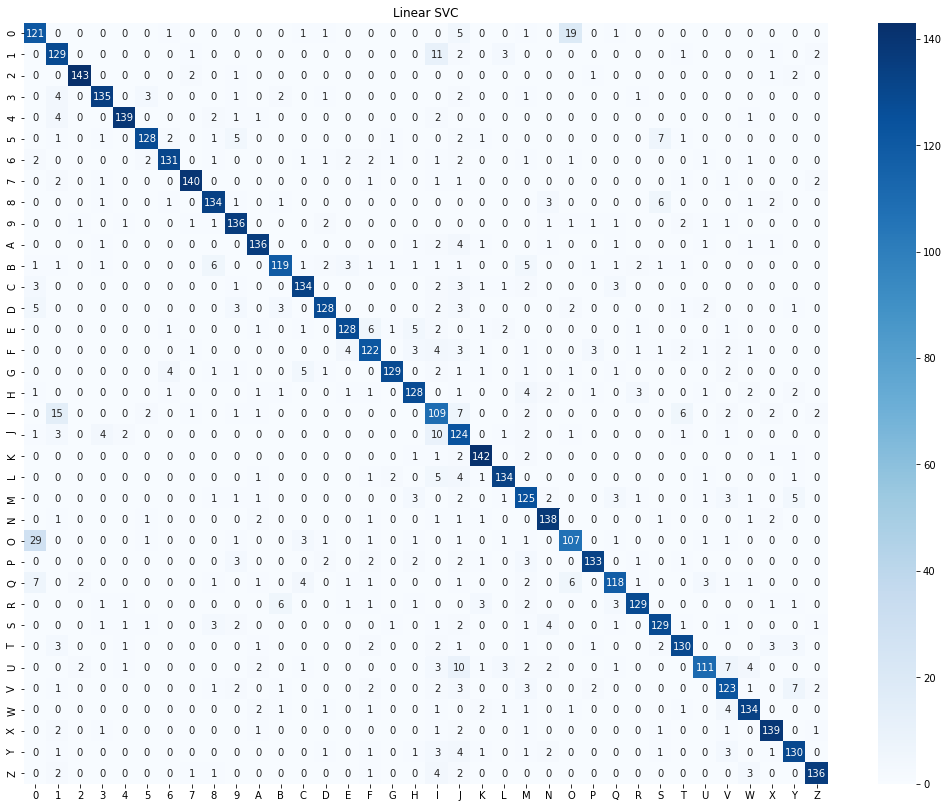

Classification report for Polynomial SVC:
              precision    recall  f1-score   support

           0       0.73      0.70      0.71       155
           1       0.95      0.90      0.92       158
           2       0.99      0.99      0.99       150
           3       0.98      0.97      0.98       151
           4       0.99      0.99      0.99       150
           5       0.96      0.99      0.97       146
           6       0.95      0.97      0.96       148
           7       0.99      0.98      0.98       151
           8       0.95      0.95      0.95       150
           9       0.97      0.98      0.98       149
           A       0.97      0.97      0.97       150
           B       0.95      0.95      0.95       151
           C       0.97      0.99      0.98       146
           D       0.97      0.97      0.97       150
           E       0.95      0.97      0.96       148
           F       0.98      0.94      0.96       157
           G       0.94      0.99      

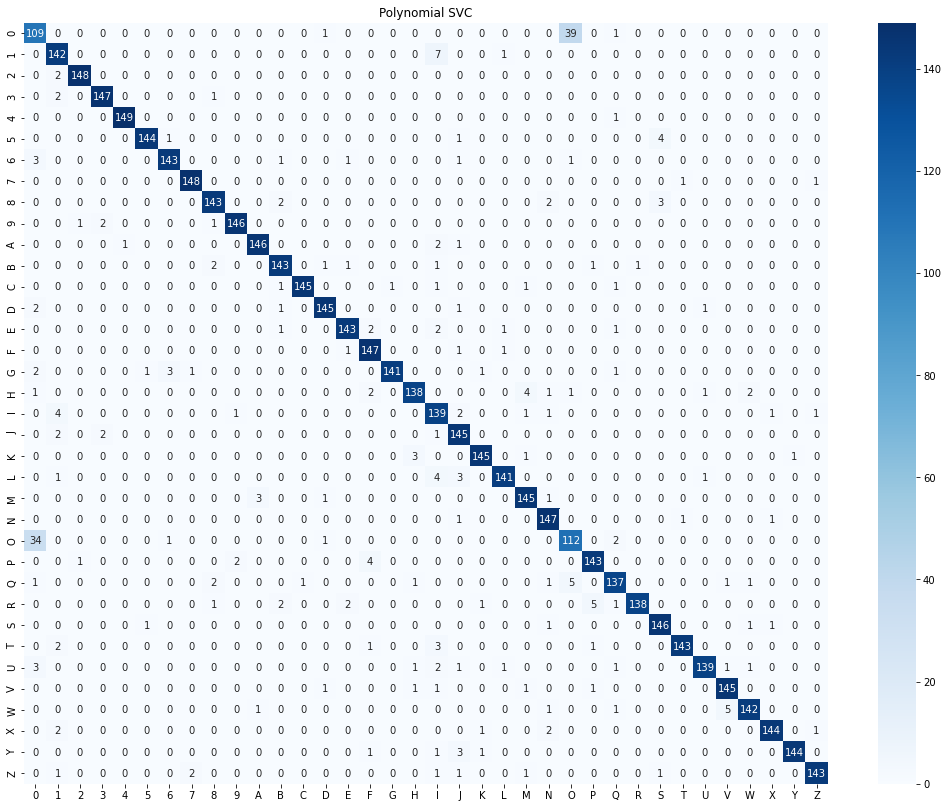

Classification report for Gaussian SVC:
              precision    recall  f1-score   support

           0       0.78      0.73      0.75       161
           1       0.94      0.92      0.93       153
           2       0.99      0.99      0.99       149
           3       0.97      0.97      0.97       150
           4       0.99      1.00      0.99       148
           5       0.97      0.99      0.98       147
           6       0.95      0.97      0.96       148
           7       1.00      1.00      1.00       150
           8       0.95      0.95      0.95       150
           9       0.97      0.97      0.97       149
           A       0.99      0.99      0.99       149
           B       0.94      0.94      0.94       150
           C       0.95      0.98      0.97       146
           D       0.96      0.96      0.96       150
           E       0.96      0.99      0.98       145
           F       0.99      0.94      0.96       158
           G       0.95      1.00      0.

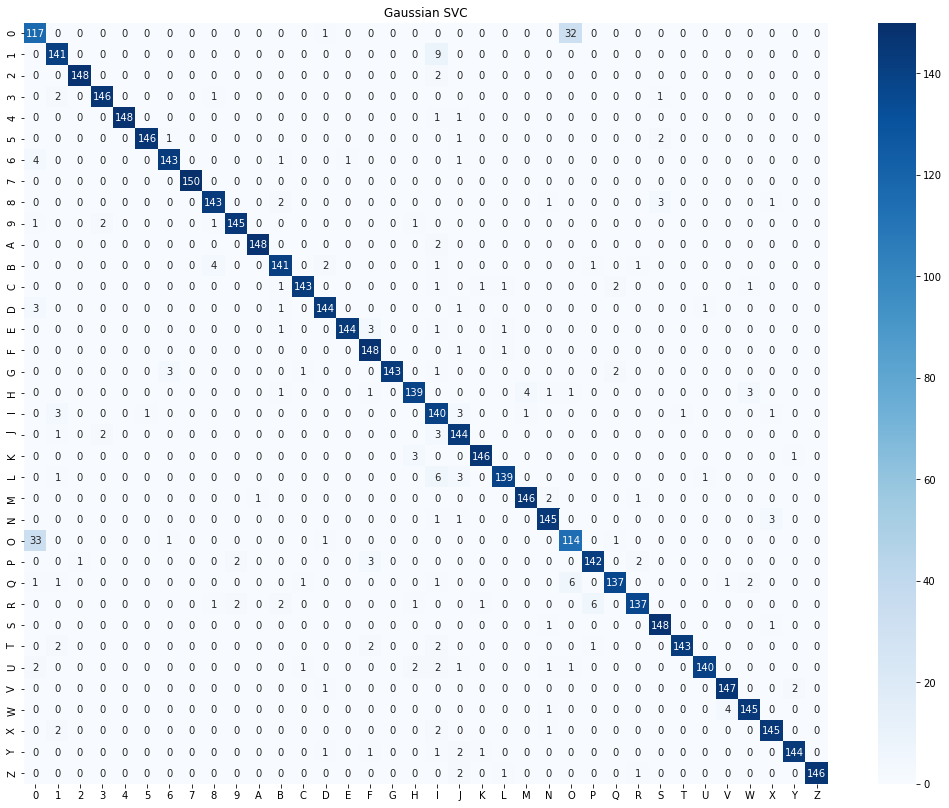

Classification report for ANN:
              precision    recall  f1-score   support

           0       0.83      0.72      0.77       174
           1       0.89      0.93      0.91       143
           2       0.99      0.97      0.98       154
           3       0.95      0.97      0.96       147
           4       0.99      0.94      0.97       158
           5       0.93      0.98      0.95       142
           6       0.96      0.94      0.95       153
           7       0.99      0.99      0.99       151
           8       0.90      1.00      0.95       135
           9       0.89      0.99      0.93       135
           A       0.98      0.80      0.88       184
           B       0.94      0.93      0.93       152
           C       0.93      0.92      0.92       153
           D       0.90      0.96      0.93       140
           E       0.95      0.78      0.85       183
           F       0.77      0.99      0.86       116
           G       0.88      0.99      0.93       

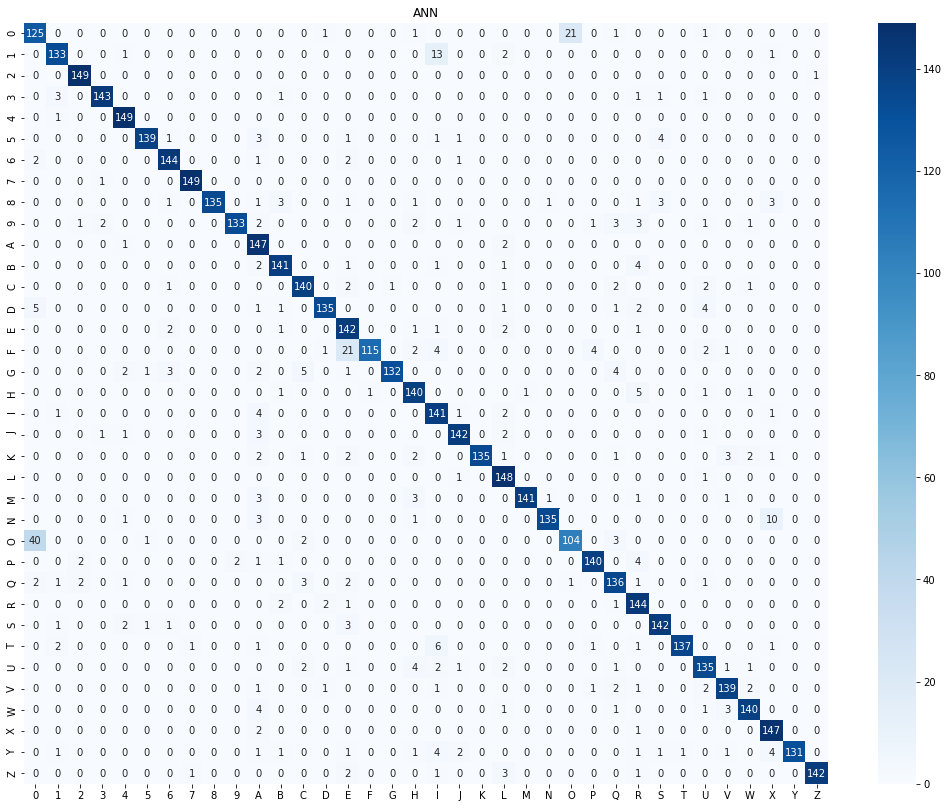

Classification report for kNN:
              precision    recall  f1-score   support

           0       0.75      0.55      0.63       203
           1       0.82      0.72      0.77       170
           2       0.99      0.97      0.98       154
           3       0.93      0.92      0.92       153
           4       0.91      0.95      0.93       144
           5       0.87      0.90      0.89       146
           6       0.86      0.91      0.88       142
           7       0.98      0.87      0.92       169
           8       0.82      0.88      0.85       140
           9       0.91      0.94      0.93       144
           A       0.97      0.99      0.98       146
           B       0.81      0.80      0.81       153
           C       0.90      0.80      0.85       169
           D       0.86      0.87      0.86       149
           E       0.75      0.76      0.76       149
           F       0.75      0.69      0.72       163
           G       0.69      0.97      0.81       

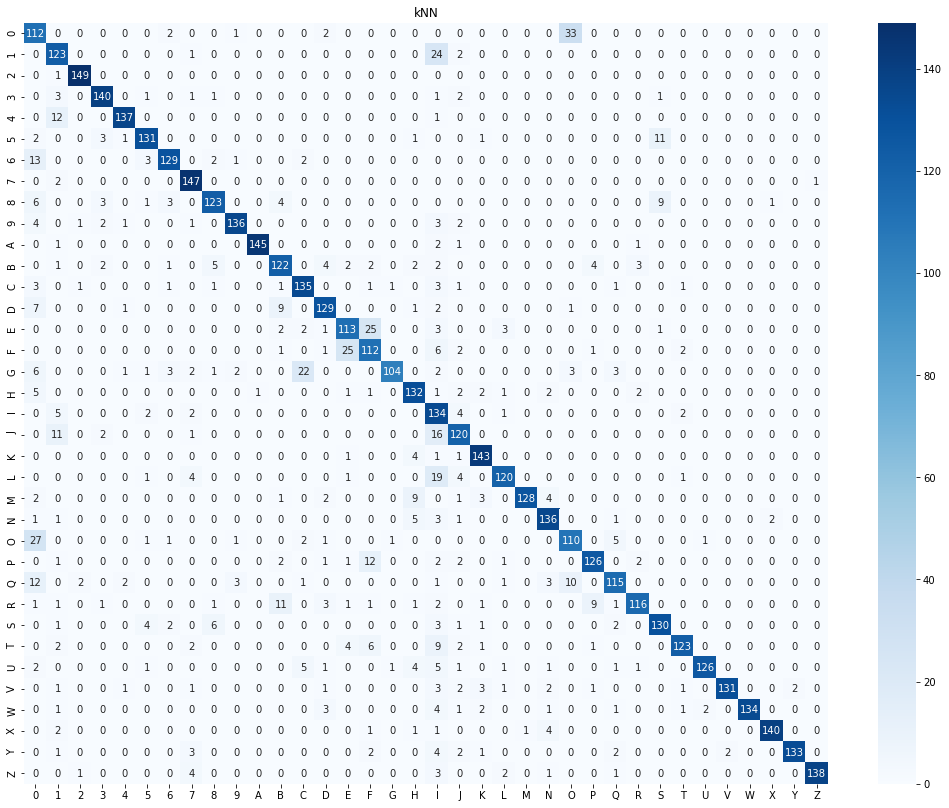

In [73]:
#classification_report & confusion_matrix
for index, model in enumerate(models):
    print(f"Classification report for {model}:")
    class_report = classification_report(est_n_scores[index][0].predict(test_X), test_y)
    print(class_report)
    plot_conf_matrix(est_n_scores[index][0], test_X, test_y, model)
    print("="*50)

We can check them carrefully and we will easily found what is anyway somehow expected: the most difficult part for all of the models is the recognition of '0' and 'O', followed by '1' and 'I'. Much less often, but still happenning are the confusions of 'J' with 'U' and 'I' again, 'F' with 'E', 'G' with 'C'.

It looks like all models are able to do the required task. It is still difficult to make the choice. So, let's try on our segmented letters from the demonstrational image, to see how it would perform in our micro "real-" world which for many reasons is still far from the perfect reality of the test set.

Using the discovered pictures after plate segmentation stage the results are:

In [74]:
plate_num, times = make_prediction(chars, est_n_scores)
print(f"{'plate numbers using Linear SVC: ': <51}{plate_num[0]}, timing: {times[0]}")
print(f"{'plate numbers using Polynomial SVC: ': <51}{plate_num[1]}, timing: {times[1]}")
print(f"{'plate numbers using Gaussian SVC: ': <51}{plate_num[2]}, timing: {times[2]}")
print(f"{'plate numbers using Fully Connected Neural Network: ': <51}{plate_num[3]}, timing: {times[3]}")
print(f"{'plate numbers using kNN: ': <51}{plate_num[4]}, timing: {times[4]}")

Start making the prediction...DONE
plate numbers using Linear SVC:                    6H9K156, timing: 0.001998710632324219
plate numbers using Polynomial SVC:                HHPK156, timing: 0.028847408294677735
plate numbers using Gaussian SVC:                  HHPK156, timing: 0.029277443885803223
plate numbers using Fully Connected Neural Network: AHPK156, timing: 0.004595017433166504
plate numbers using kNN:                           HHPK156, timing: 0.08502557277679443


In [75]:
plate_num2, times2 = make_prediction(crop_characters, est_n_scores)
print(f"{'plate numbers using Linear SVC: ': <51}{plate_num2[0]}, timing: {times2[0]}")
print(f"{'plate numbers using Polynomial SVC: ': <51}{plate_num2[1]}, timing: {times2[1]}")
print(f"{'plate numbers using Gaussian SVC: ': <51}{plate_num2[2]}, timing: {times2[2]}")
print(f"{'plate numbers using Fully Connected Neural Network: ': <51}{plate_num2[3]}, timing: {times2[3]}")
print(f"{'plate numbers using kNN: ': <51}{plate_num2[4]}, timing: {times2[4]}")

Start making the prediction...DONE
plate numbers using Linear SVC:                    HHPK156, timing: 0.0015984296798706055
plate numbers using Polynomial SVC:                HHPK1D6, timing: 0.03108232021331787
plate numbers using Gaussian SVC:                  HHPK156, timing: 0.029285597801208495
plate numbers using Fully Connected Neural Network: HHPK156, timing: 0.004595041275024414
plate numbers using kNN:                           HHPK1D6, timing: 0.07621686458587647


Seeing these results, we can draw two conclusions: 

1. The number of observations when modelling is indeed really important.
2. It is even more obvious here, that the way we segment the characters is also dramatically important. It is interesting to note how, for this special case, depending on the noise each of the models have at least one correct outcome.

Having in mind that the way the characters are segmented will differ with the different images, maybe the model with overlapping results should arm us with the most robust model. So, checking both results, it looks like the Gaussian SVC can take the prize, as most stable.

***V.*** **Character recognition - tests on car images dataset**

Everything above sounds very well. If I follow the articles found on Internet, I can stop here and claim that it is enough. But that was not my intial aim. That is why I will perform experiments on a dataset of pre-selected images where the license plate is visible and applying the whole process should be able to get the correct answer.

After making our preliminary choice on one input number plate, let's check the accuracy and the precision fo the model on real test dataset. 
44 images of number plates, extracted in the way described above. The experimental results will be based on best performing models of RBF kernel and in order to compare a simple model like kNN.

The first step is the extraction of all the pictures and creation of the dataset matrix. For that I use the function created earlier called `read_images()`.

In [76]:
dir_name = "data\\test\\"
images = read_images(dir_name)

In [77]:
len(images)

44

Of course, I am curious to see at least for the first 10 pictures what we have read. To visalize them I use the created functions `show()`:

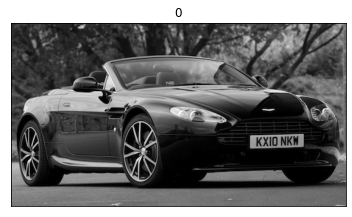

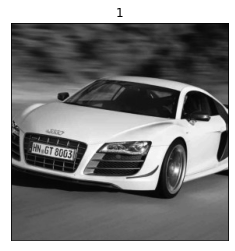

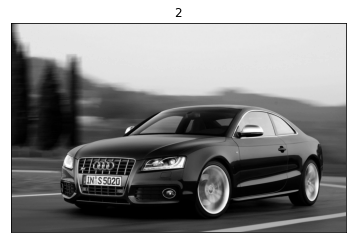

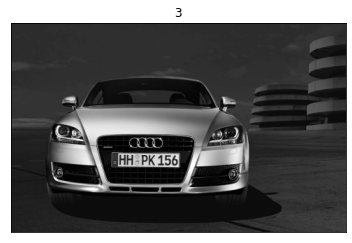

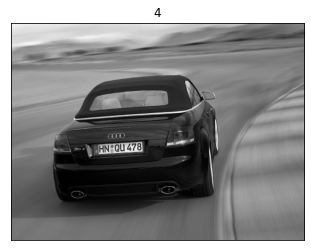

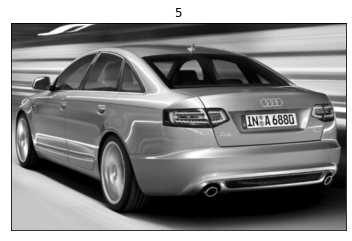

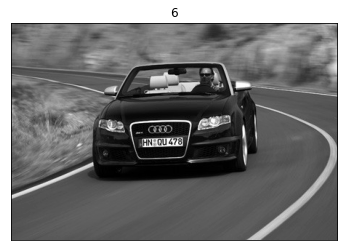

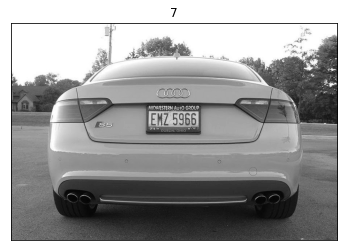

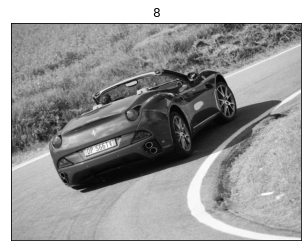

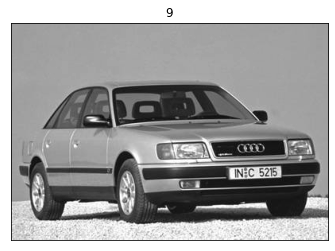

In [78]:
for i in range(10):
    show(images[i], i)

Now, the initial step involved the creation of similar matrix containing the same images in binary format. Here, I can use as before the function `binary_image()` and save all the images in new matrix called `binary_images`.

In [79]:
binary_images = np.empty(len(images), dtype=object)
for i in range(len(images)):
    binary_images[i] = binary_image(images[i])

I need to be sure that the new matrix contains all binary images, checking that on a random image with `randint()` function:

In [80]:
assert len(images) == len(binary_images)
assert type(images) == type(binary_images)
random_image = randint(0, len(images)- 1)
assert len(np.unique(binary_images[random_image])) == 2

Let's see again with `show()` how the same first 10 pictures look like:

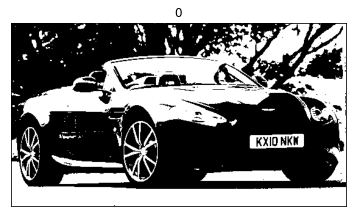

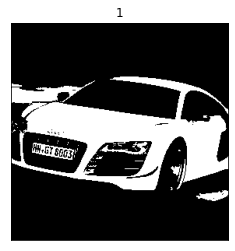

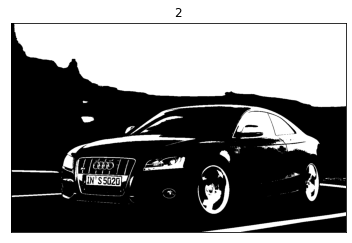

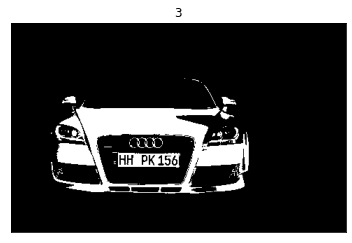

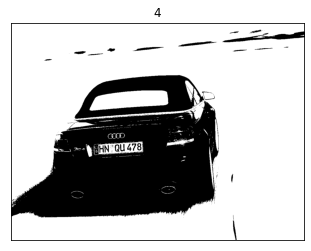

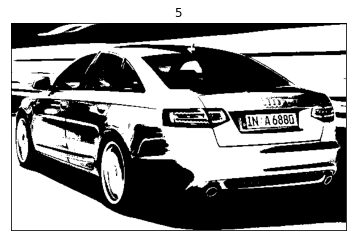

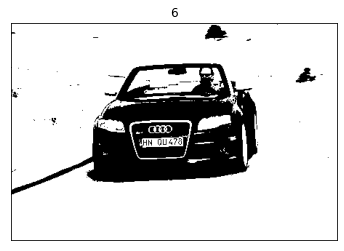

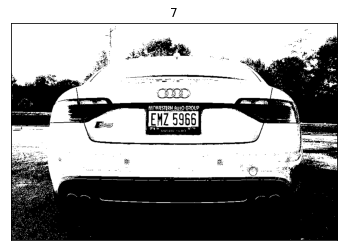

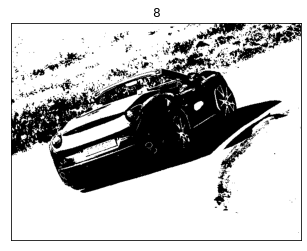

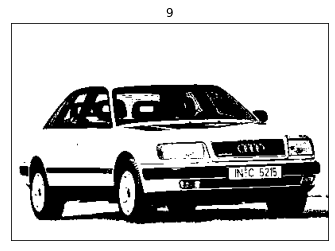

In [81]:
for i in range(10):
    show(binary_images[i], i)

So good, so far! Now, I will check how the CCA method from skimage would work on this dataset. I have a function waiting for this moment called `detect_plate_CCA()`:

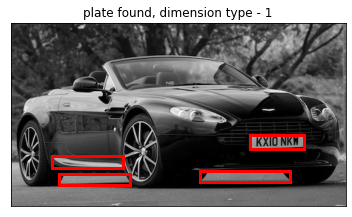

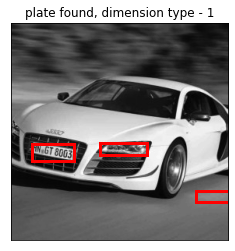

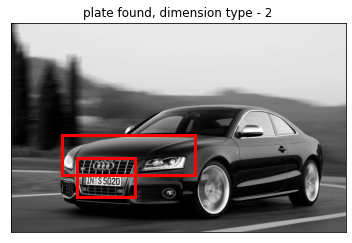

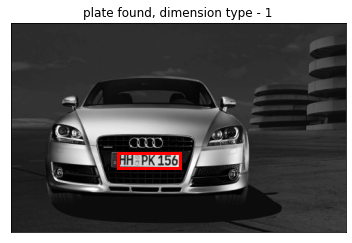

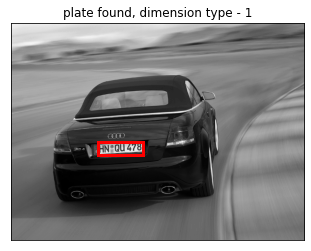

...

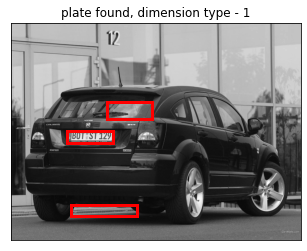

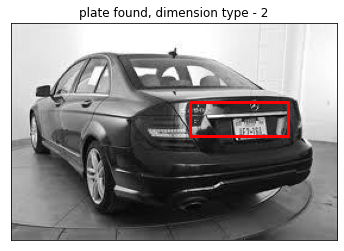

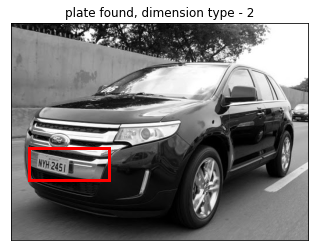

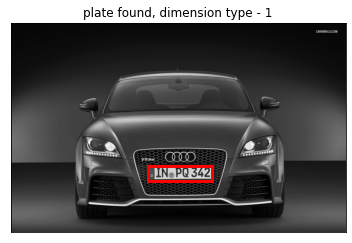

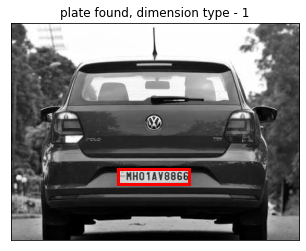

In [82]:
plates_list = []
for i in range(len(binary_images)):
    plates_list = detect_plate_CCA(images[i], binary_images[i], plates_list)

I have to remind that unfortunately, after a visual check and manual calculation of the success rate of this method on a bigger dataset of car images, even if it is quite spread as example over the Internet, it is below 10%, which is quite unsatissfying. Of course, that is true, since car images are not pre-defined in terms of position, lightening conditions the size of the cars in the picture. In case of stationary camera placed at specific position, like for instance on the entry of a garage, toll pass or something similar, the method would perform at better or hopefully on acceptable level.

For this demonstration the pictures are partially pre-selected. 

Another inconvenience, that is visible here is that at the end of this plate detection and recognition process using `detect_plate_CCA` function, the size of `plates_list` is bigger that the initial size of the read images. Sounds unlogical, but the reason is that there are many "false" plates detected.

In [83]:
len(plates_list)

73

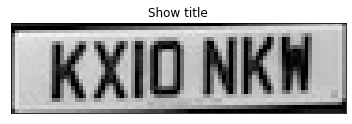

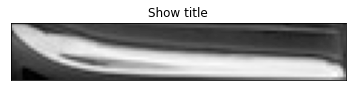

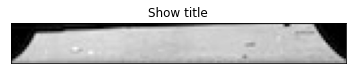

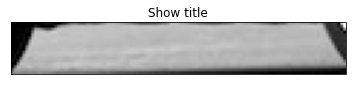

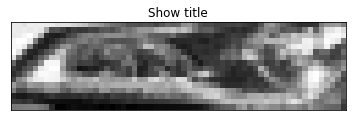

...

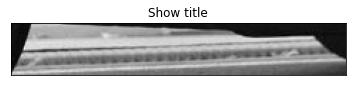

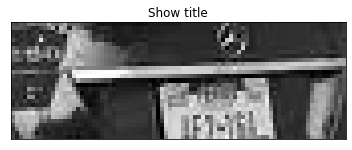

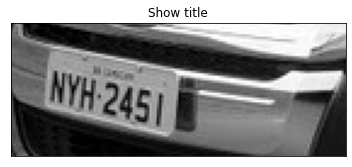

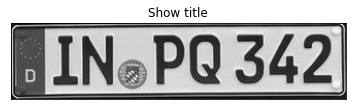

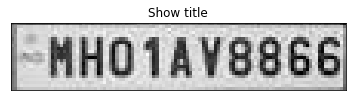

In [84]:
for im in plates_list:
    show(im)

We can apply the deskewing function and will provide all the deskewed plates further to our segmenting functions.

Best angle: -1


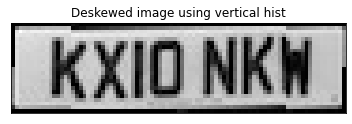

Best angle: 1


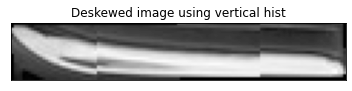

Best angle: -2


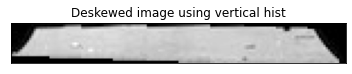

Best angle: -1


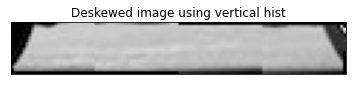

Best angle: 2


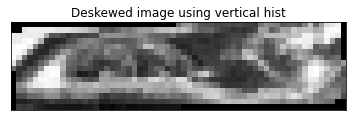

Best angle: 11


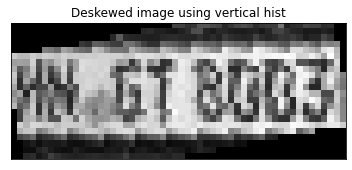

Best angle: -1


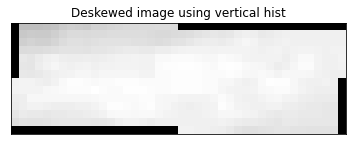

Best angle: 2


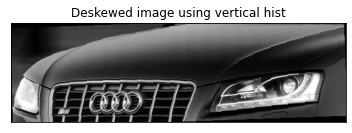

Best angle: 2


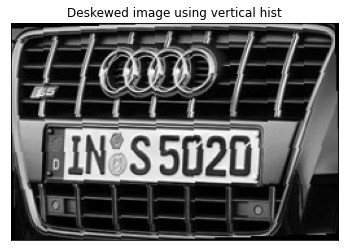

Best angle: 1


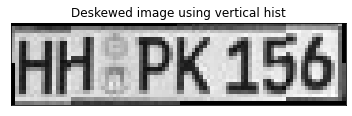

Best angle: -3


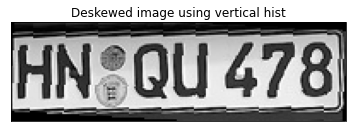

Best angle: -6


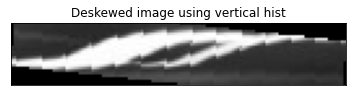

Best angle: -3


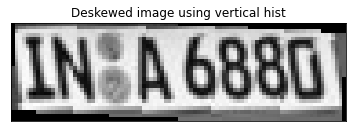

Best angle: -5


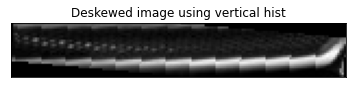

Best angle: -1


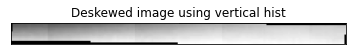

Best angle: -2


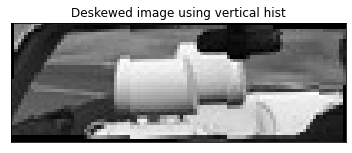

Best angle: -2


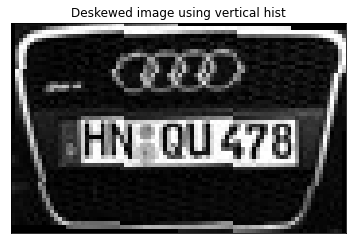

Best angle: -1


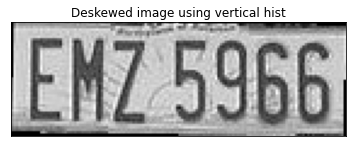

Best angle: 1


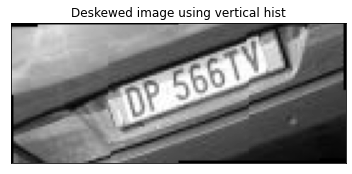

Best angle: -1


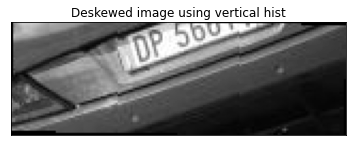

Best angle: -1


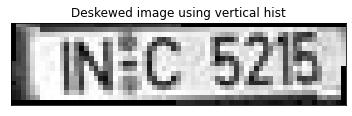

Best angle: -4


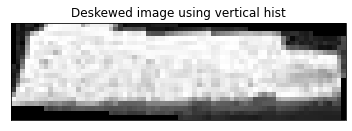

Best angle: -3


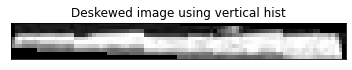

Best angle: -1


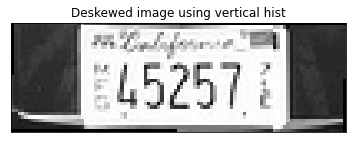

Best angle: -1


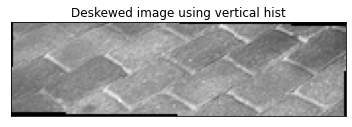

Best angle: -1


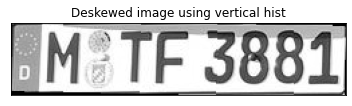

Best angle: 0


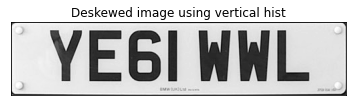

Best angle: 3


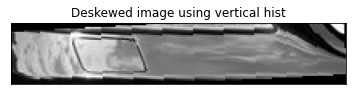

Best angle: 0


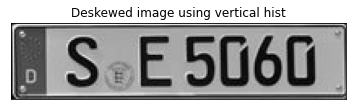

Best angle: -1


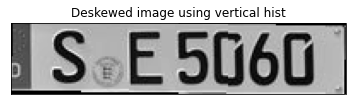

Best angle: 3


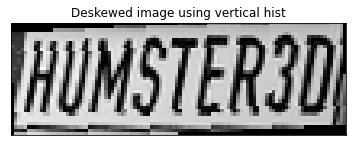

Best angle: -6


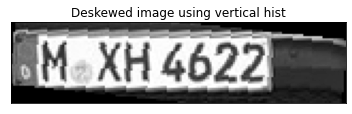

Best angle: -5


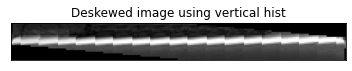

Best angle: 3


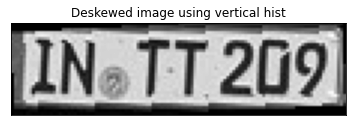

Best angle: 2


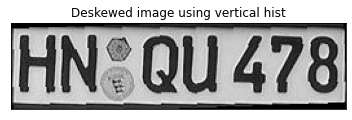

Best angle: 4


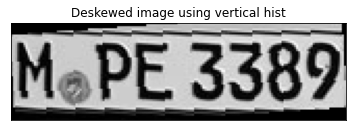

Best angle: 1


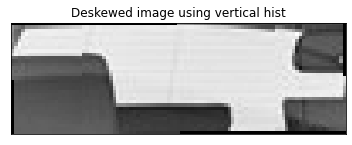

Best angle: 1


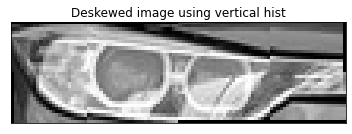

Best angle: -1


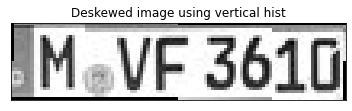

Best angle: -1


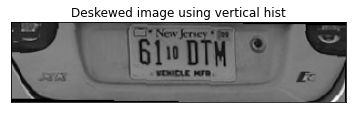

Best angle: 7


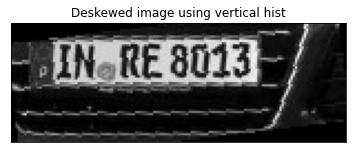

Best angle: -1


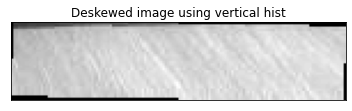

Best angle: -1


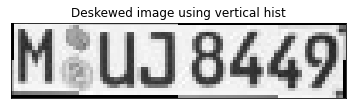

Best angle: -1


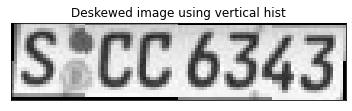

Best angle: -1


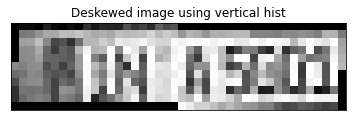

Best angle: -1


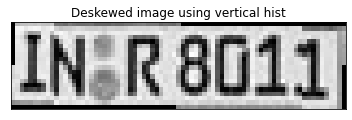

Best angle: -1


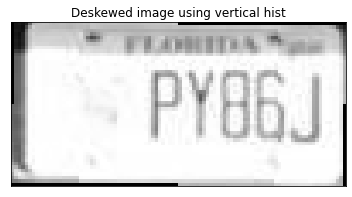

Best angle: 1


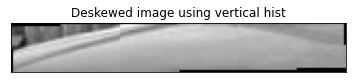

Best angle: -1


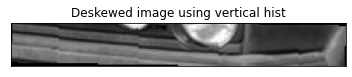

Best angle: 6


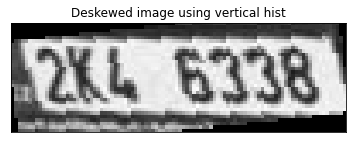

Best angle: 2


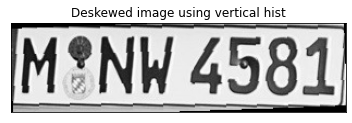

Best angle: -1


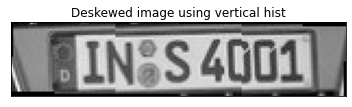

Best angle: 1


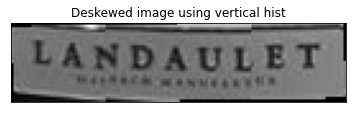

Best angle: 3


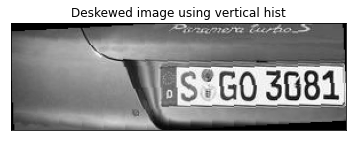

Best angle: -5


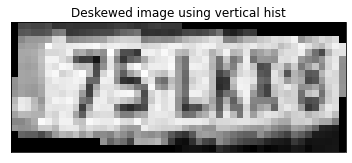

Best angle: -1


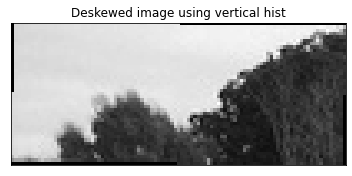

Best angle: 1


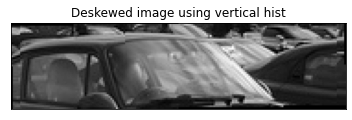

Best angle: 1


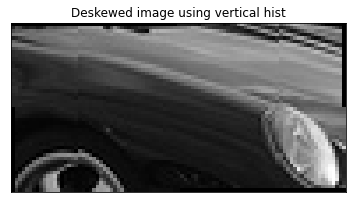

Best angle: -13


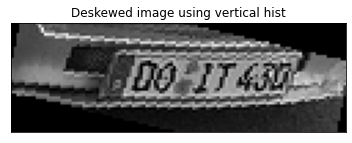

Best angle: -1


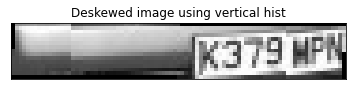

Best angle: 0


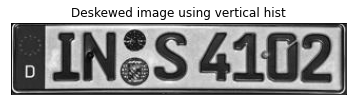

Best angle: -1


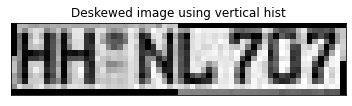

Best angle: 5


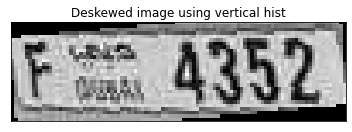

Best angle: 1


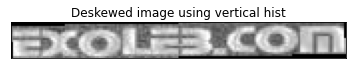

Best angle: 1


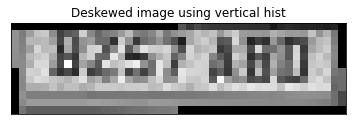

Best angle: 1


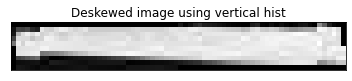

Best angle: 1


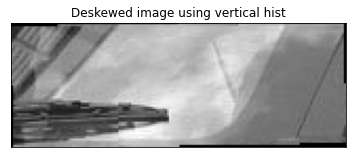

Best angle: 1


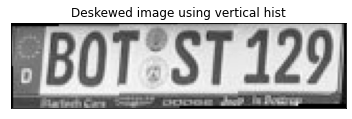

Best angle: -2


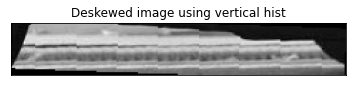

Best angle: -2


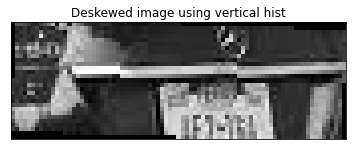

Best angle: -1


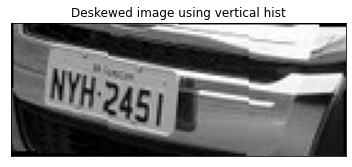

Best angle: 0


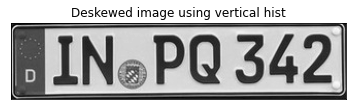

Best angle: 1


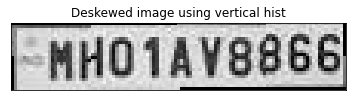

In [85]:
deskewed_plates_list = []
for chopped in plates_list:
    temporary = deskew_using_vert_hist(chopped)
    show(temporary, "Deskewed image using vertical hist")
    deskewed_plates_list.append(temporary)

I will use both segmentation functions I have created to compare their success rate. The good side effect ot these functions is that they serve as aditional filter for the plate detection: wherever there are no detected segments, there is no output from them.

Detected 7 letters...


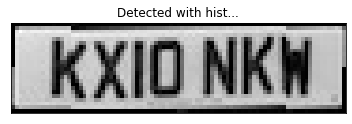

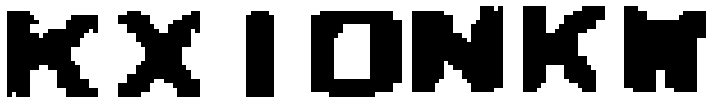

Start making the prediction...DONE
plate numbers using Gaussian SVC: KX1ONKM, timing: 0.04882798194885254
plate numbers using kNN: KX1ONXH, timing: 0.07728776931762696
Detected 6 characters...


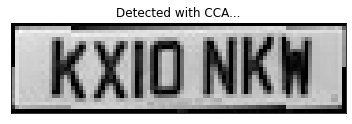

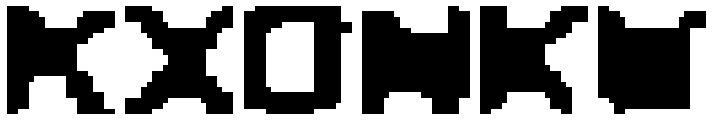

Start making the prediction...DONE
plate numbers using Gaussian SVC: KXDNKW, timing: 0.027983736991882325
plate numbers using kNN: KXDNKW, timing: 0.06909584999084473
Detected 7 letters...


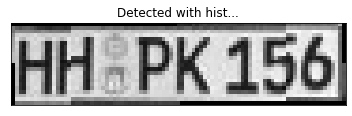

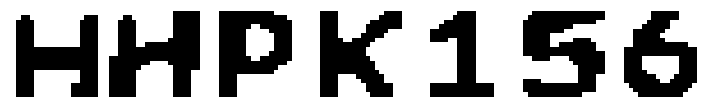

Start making the prediction...DONE
plate numbers using Gaussian SVC: HHPK1S6, timing: 0.03418045043945313
plate numbers using kNN: HHPR156, timing: 0.0863295316696167
Detected 8 characters...


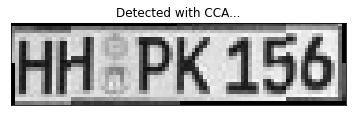

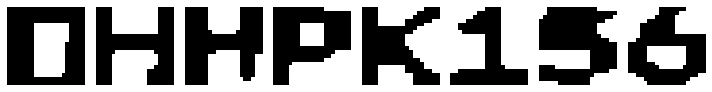

Start making the prediction...DONE
plate numbers using Gaussian SVC: DHHPK156, timing: 0.04573900699615478
plate numbers using kNN: DHHPK156, timing: 0.11737158298492431
Detected 8 letters...


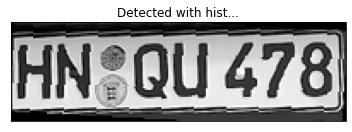

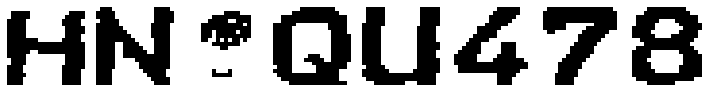

Start making the prediction...DONE
plate numbers using Gaussian SVC: HNYQU478, timing: 0.04177470207214355
plate numbers using kNN: HN10U47B, timing: 0.10993030071258544
Detected 7 characters...


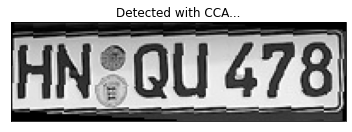

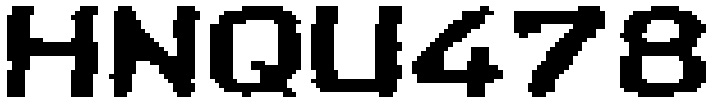

Start making the prediction...DONE
plate numbers using Gaussian SVC: HNQU478, timing: 0.035723423957824706
plate numbers using kNN: HH0U47B, timing: 0.09394755363464355
Detected 6 letters...


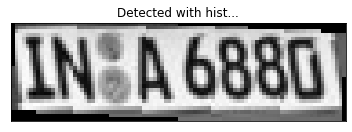

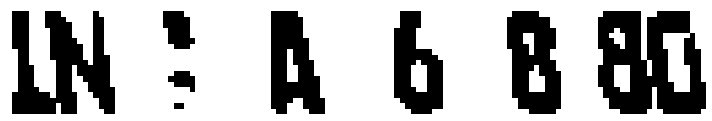

Start making the prediction...DONE
plate numbers using Gaussian SVC: W1N68W, timing: 0.03088235855102539
plate numbers using kNN: W1R6I6, timing: 0.07798526287078858
Detected 7 characters...


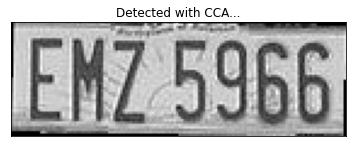

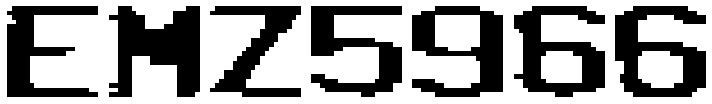

Start making the prediction...DONE
plate numbers using Gaussian SVC: EMZ5DBB, timing: 0.03517992496490478
plate numbers using kNN: EHZ50EG, timing: 0.09154791831970215
Detected 6 letters...


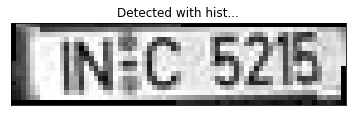

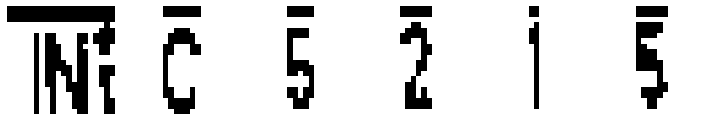

Start making the prediction...DONE
plate numbers using Gaussian SVC: RTJ11T, timing: 0.03188199996948242
plate numbers using kNN: T7II1I, timing: 0.07521591186523438
Detected 5 characters...


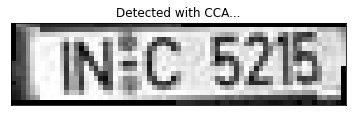

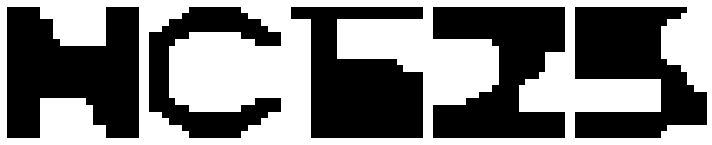

Start making the prediction...DONE
plate numbers using Gaussian SVC: NCB25, timing: 0.02783205509185791
plate numbers using kNN: NOEZ5, timing: 0.06276416778564453
Detected 5 letters...


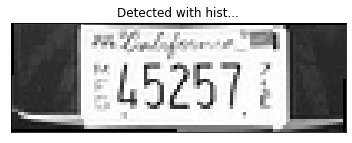

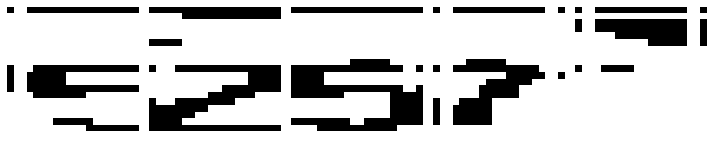

Start making the prediction...DONE
plate numbers using Gaussian SVC: RB6FT, timing: 0.0263871431350708
plate numbers using kNN: F7F7T, timing: 0.07398400306701661
Detected 7 characters...


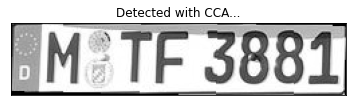

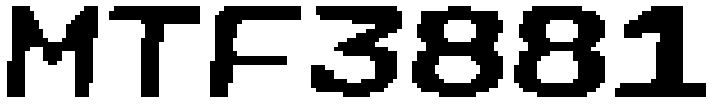

Start making the prediction...DONE
plate numbers using Gaussian SVC: MTK38B1, timing: 0.03506016731262207
plate numbers using kNN: HTV3BB1, timing: 0.09374771118164063
Detected 7 letters...


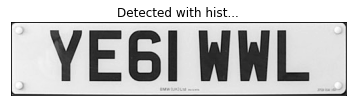

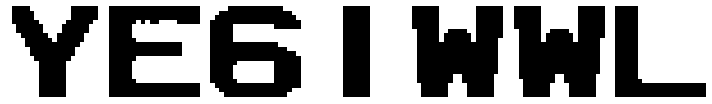

Start making the prediction...DONE
plate numbers using Gaussian SVC: YEBIWWL, timing: 0.042282915115356444
plate numbers using kNN: YEBIWWL, timing: 0.08413634300231934
Detected 6 characters...


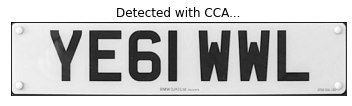

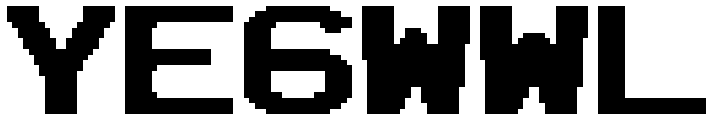

Start making the prediction...DONE
plate numbers using Gaussian SVC: YEBWWL, timing: 0.028144001960754395
plate numbers using kNN: YEBWHL, timing: 0.0797541618347168
Detected 6 characters...


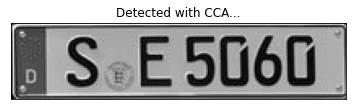

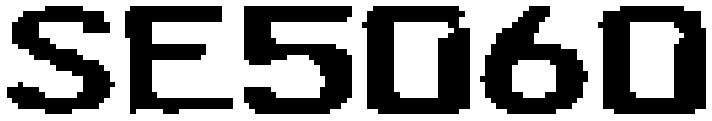

Start making the prediction...DONE
plate numbers using Gaussian SVC: SE5D6D, timing: 0.03328120708465576
plate numbers using kNN: SE5D6D, timing: 0.0681302785873413
Detected 6 letters...


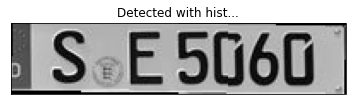

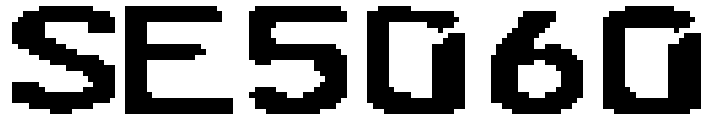

Start making the prediction...DONE
plate numbers using Gaussian SVC: SE5D60, timing: 0.030081462860107423
plate numbers using kNN: SE5D6D, timing: 0.07665755748748779
Detected 7 characters...


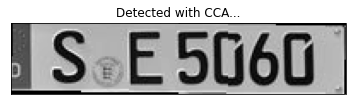

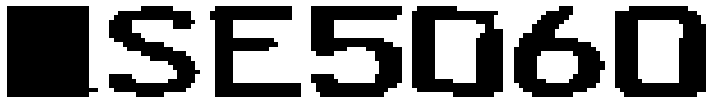

Start making the prediction...DONE
plate numbers using Gaussian SVC: BSE5D6D, timing: 0.042964839935302736
plate numbers using kNN: BSE5D6D, timing: 0.09382433891296386
Detected 5 letters...


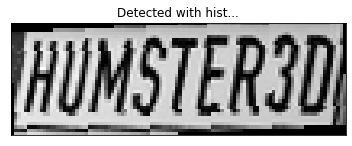

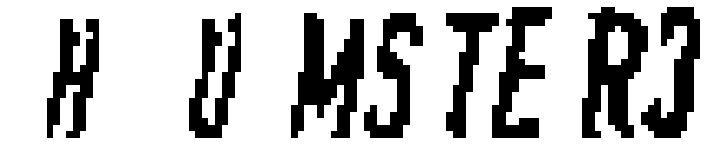

Start making the prediction...DONE
plate numbers using Gaussian SVC: 41WGB, timing: 0.0261427640914917
plate numbers using kNN: HHW1N, timing: 0.06490516662597656
Detected 9 characters...


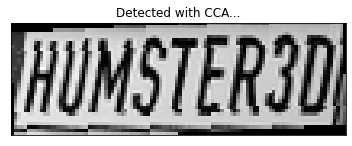

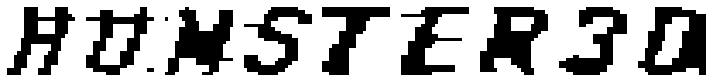

Start making the prediction...DONE
plate numbers using Gaussian SVC: HUMSTER3D, timing: 0.051849365234375
plate numbers using kNN: HUNSTER3D, timing: 0.12472906112670898
Detected 7 letters...


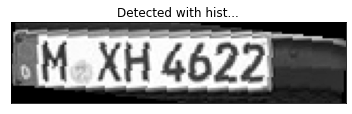

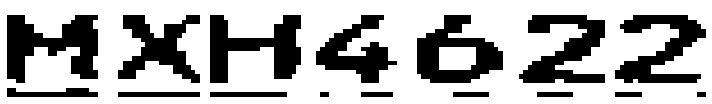

Start making the prediction...DONE
plate numbers using Gaussian SVC: M8B4622, timing: 0.03647711277008057
plate numbers using kNN: H8H4OZZ, timing: 0.09120478630065917
Detected 7 letters...


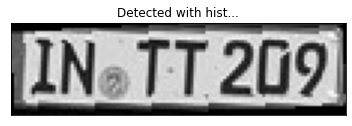

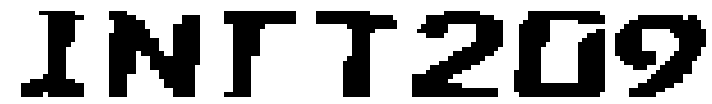

Start making the prediction...DONE
plate numbers using Gaussian SVC: 1NT12D9, timing: 0.040228867530822755
plate numbers using kNN: 1NTT2D9, timing: 0.09130191802978516
Detected 8 letters...


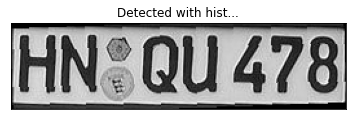

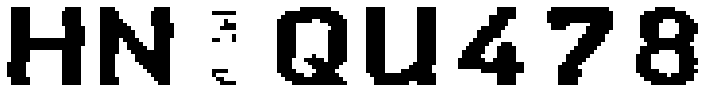

Start making the prediction...DONE
plate numbers using Gaussian SVC: HN1QU478, timing: 0.045049738883972165
plate numbers using kNN: HNNOU478, timing: 0.10701606273651124
Detected 7 characters...


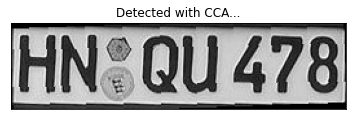

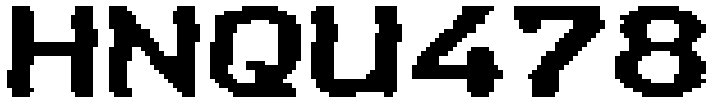

Start making the prediction...DONE
plate numbers using Gaussian SVC: HNQU478, timing: 0.04159550666809082
plate numbers using kNN: HN0U47B, timing: 0.1099973440170288
Detected 8 letters...


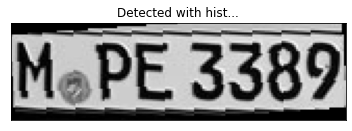

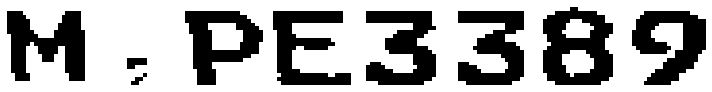

Start making the prediction...DONE
plate numbers using Gaussian SVC: M4PE3389, timing: 0.04524152278900147
plate numbers using kNN: HIPE33B9, timing: 0.11253504753112793
Detected 7 characters...


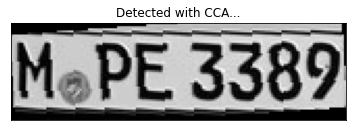

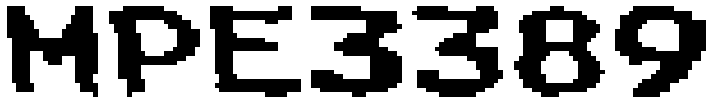

Start making the prediction...DONE
plate numbers using Gaussian SVC: MPE3389, timing: 0.03877851963043213
plate numbers using kNN: HPE33B9, timing: 0.09785552024841308
Detected 7 letters...


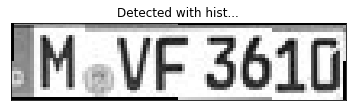

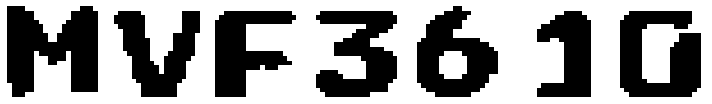

Start making the prediction...DONE
plate numbers using Gaussian SVC: HMG3610, timing: 0.03757920265197754
plate numbers using kNN: HVF364D, timing: 0.0934312105178833
Detected 7 characters...


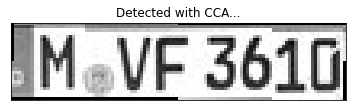

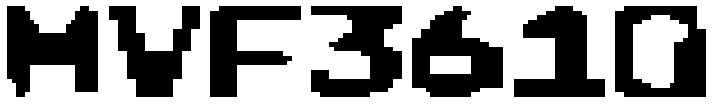

Start making the prediction...DONE
plate numbers using Gaussian SVC: MVK361D, timing: 0.03760838508605957
plate numbers using kNN: HVP361D, timing: 0.09335441589355468
Detected 5 letters...


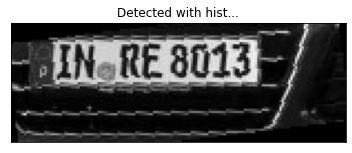

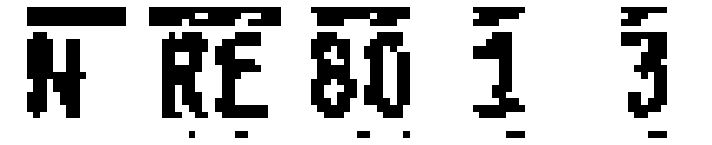

Start making the prediction...DONE
plate numbers using Gaussian SVC: FW9X1, timing: 0.027284455299377442
plate numbers using kNN: FF011, timing: 0.07236306667327881
Detected 8 letters...


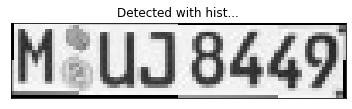

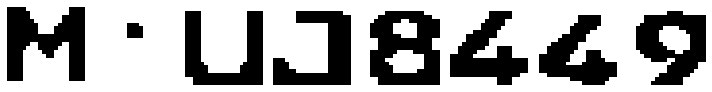

Start making the prediction...DONE
plate numbers using Gaussian SVC: MTUDB6K9, timing: 0.03881790637969971
plate numbers using kNN: MNU2B449, timing: 0.0942803144454956
Detected 7 characters...


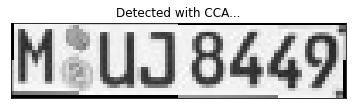

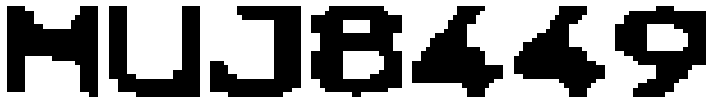

Start making the prediction...DONE
plate numbers using Gaussian SVC: MU3B449, timing: 0.030882763862609863
plate numbers using kNN: MU08449, timing: 0.08085379600524903
Detected 7 characters...


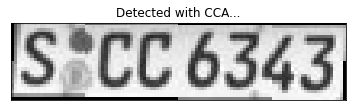

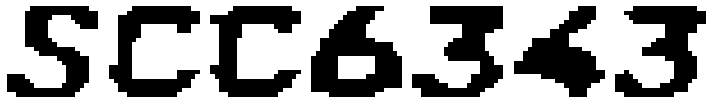

Start making the prediction...DONE
plate numbers using Gaussian SVC: SCC6343, timing: 0.03168728351593018
plate numbers using kNN: SCC6343, timing: 0.0760305643081665
Detected 8 letters...


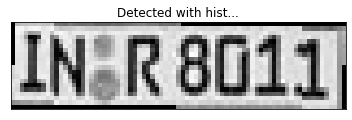

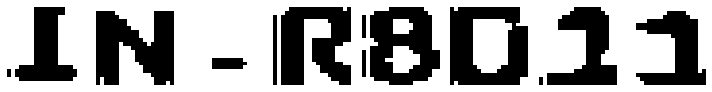

Start making the prediction...DONE
plate numbers using Gaussian SVC: IN4R8D33, timing: 0.03328225612640381
plate numbers using kNN: IN4R8DJJ, timing: 0.08491501808166504
Detected 7 characters...


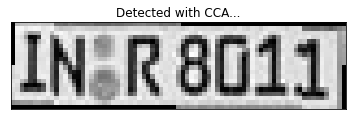

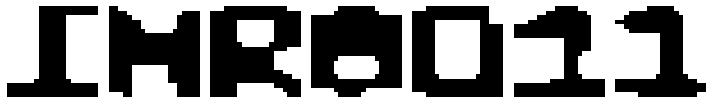

Start making the prediction...DONE
plate numbers using Gaussian SVC: 1NRBD21, timing: 0.029406976699829102
plate numbers using kNN: IHR0D21, timing: 0.07395777702331544
Detected 6 characters...


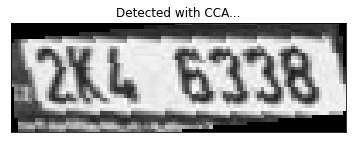

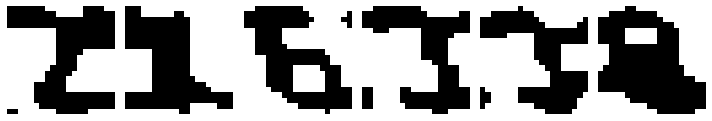

Start making the prediction...DONE
plate numbers using Gaussian SVC: ZLB33R, timing: 0.025287866592407227
plate numbers using kNN: ZLE33R, timing: 0.06356139183044433
Detected 8 letters...


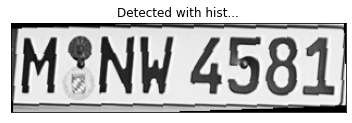

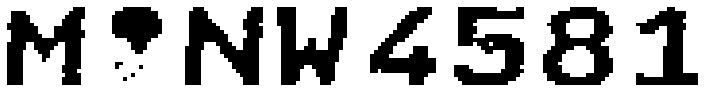

Start making the prediction...DONE
plate numbers using Gaussian SVC: MPNW4S81, timing: 0.03587963581085205
plate numbers using kNN: H1NW4SB1, timing: 0.09234933853149414
Detected 9 letters...


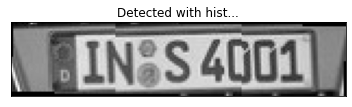

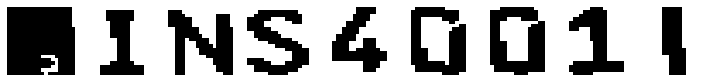

Start making the prediction...DONE
plate numbers using Gaussian SVC: B1NS4DD1I, timing: 0.04087839126586914
plate numbers using kNN: B1NS4OO1I, timing: 0.10623784065246582
Detected 9 letters...


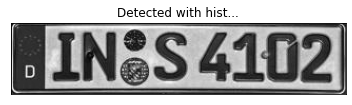

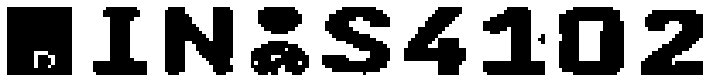

Start making the prediction...DONE
plate numbers using Gaussian SVC: B1NXS4102, timing: 0.04172794818878174
plate numbers using kNN: B1NZS41D2, timing: 0.10589263439178467
Detected 7 letters...


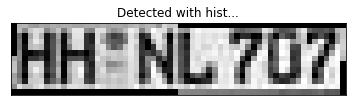

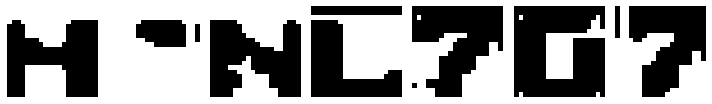

Start making the prediction...DONE
plate numbers using Gaussian SVC: HYNCTD2, timing: 0.03128457069396973
plate numbers using kNN: HTNK7D7, timing: 0.08130793571472168
Detected 4 characters...


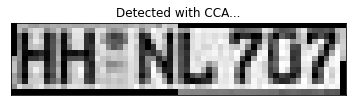

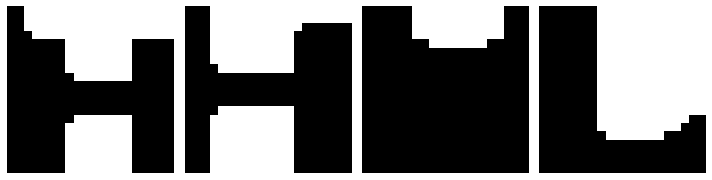

Start making the prediction...DONE
plate numbers using Gaussian SVC: HHNL, timing: 0.018190431594848632
plate numbers using kNN: HHML, timing: 0.04742610454559326
Detected 5 characters...


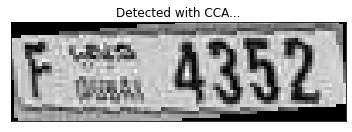

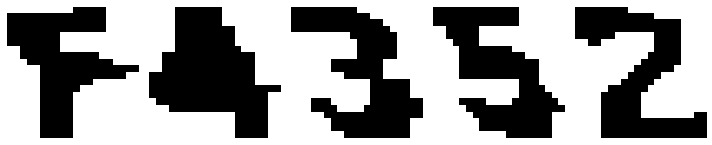

Start making the prediction...DONE
plate numbers using Gaussian SVC: FR352, timing: 0.02368662357330322
plate numbers using kNN: F4352, timing: 0.06638855934143066
Detected 10 letters...


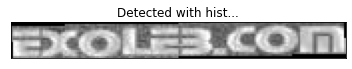

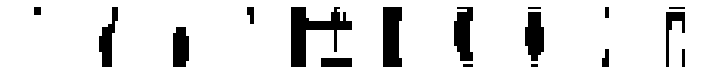

Start making the prediction...DONE
plate numbers using Gaussian SVC: 7I4IUIII1I, timing: 0.045775103569030764
plate numbers using kNN: NIIIDIII1L, timing: 0.11828575134277344
Detected 9 letters...


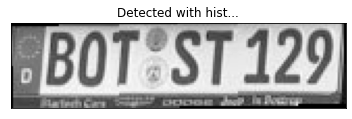

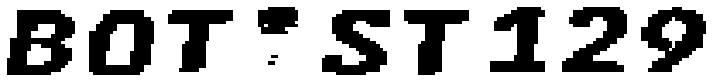

Start making the prediction...DONE
plate numbers using Gaussian SVC: B0TTST329, timing: 0.04067761898040771
plate numbers using kNN: BDT1ST429, timing: 0.1067467212677002
Detected 8 characters...


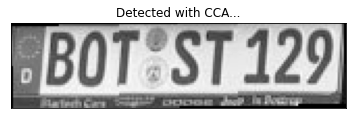

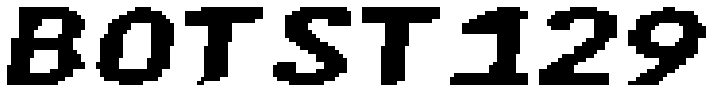

Start making the prediction...DONE
plate numbers using Gaussian SVC: BOTST329, timing: 0.036781144142150876
plate numbers using kNN: BOTST329, timing: 0.09780051708221435
Detected 9 letters...


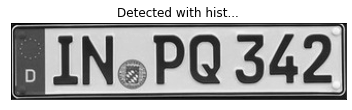

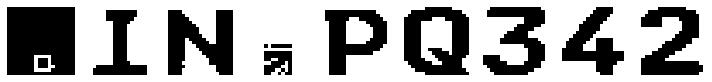

Start making the prediction...DONE
plate numbers using Gaussian SVC: B1N4PQ342, timing: 0.037709498405456544
plate numbers using kNN: BIN4P0342, timing: 0.09440412521362304
Detected 10 letters...


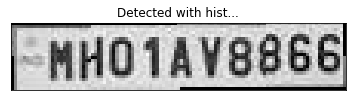

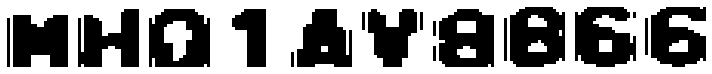

Start making the prediction...DONE
plate numbers using Gaussian SVC: MH01AVBB66, timing: 0.042376017570495604
plate numbers using kNN: NHO1AV0006, timing: 0.10574190616607666
Detected 10 characters...


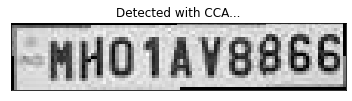

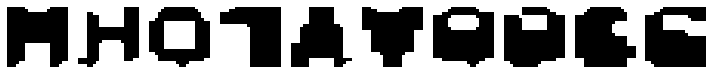

Start making the prediction...DONE
plate numbers using Gaussian SVC: HBO3AVQBGG, timing: 0.04177637100219726
plate numbers using kNN: HHO3AY006G, timing: 0.10499205589294433


In [86]:
chars_list = list()
crop_characters_list = list()
for pretender in deskewed_plates_list:
    # executing the function
    chars_tmp = segmentation_via_histogram_of_pixel_projection(pretender)
    if chars_tmp is not None:
        show(pretender, "Detected with hist...")
        chars_list.append(chars_tmp)
        show_chars(chars_tmp)
        plate_numbers, timing = make_prediction(chars_tmp, [est_n_scores[2], est_n_scores[4]])
    
        print(f"plate numbers using Gaussian SVC: {plate_numbers[0]}, timing: {timing[0]}")
        print(f"plate numbers using kNN: {plate_numbers[1]}, timing: {timing[1]}")
        
    #### OR

    # executing the function
    crop_characters_tmp = segmentation_via_opencv_and_cca(pretender)
    if crop_characters_tmp is not None:
        show(pretender, "Detected with CCA...")
        crop_characters_list.append(crop_characters_tmp)
        show_chars(crop_characters_tmp)
        plate_number2, times2 = make_prediction(crop_characters_tmp, [est_n_scores[2], est_n_scores[4]])

        print(f"plate numbers using Gaussian SVC: {plate_number2[0]}, timing: {times2[0]}")
        #print(f"plate numbers using Fully Connected Neural Network: {plate_number2[1]}, timing: {times2[1]}")
        print(f"plate numbers using kNN: {plate_number2[1]}, timing: {times2[1]}")
        
    print("="*25)

The output of the segmenting function is vital for correct recognition of the characters on the plate. It is visible that whenever there is some false character detection, a false character recognition follows.

***VI.*** **Conclusions and future work**

As seen in Section V. where tests on "random" images dataset are conducted, creating an LPR program is not such an easy task. The success rate is tremendously decreased on the first step, when we detect and crop the plate. Segmenting the characters can help us filter some false license plate outcomes from the first step, but it can't be made in a way to improve the segmented character quality. Furthermore, some incorrect segmenting at this step are vital for the final result. As already said in the beginning these 2 pre-processing steps are really, really, REALLY important for correct recognition of a license plate. In most commercial proposals available, these problems are reduced significantly by ensuring high definition images, constant distance and position of the car in the image, constant illumination etc. Consequently these intial improvement play their role in each of the key factors explained in the beginning of this notebook: **image size, processing time** and **success rate**.

The process of "training" a model is complex task. In fact this is the main part of this notebook, as final project of ML specialization. Once **correctly** done it turns out that there are many models that can serve well enough the task with small inaccuracies. The difficulties arise when the dataset is limited. In such cases at each step important decisions should be taken in **the correct** way, so that the results are satisfying. These decisions define the direction that should be taken, which set the time required for the training and the appropriate outcome. At the end, after the training is done in the "right" way, the model (character recognition) may become the most robust part of the whole process of LPR.

Currently, there is space for further improvement here, but when the input after the segmentation is at satifying level, a well trained model will do almost unflawlessly its job.

That is why, as a final conclusion we can say that real further improvement would be to implement a machine learning algorithm for the pre-processing as well.

### References:

- License Plate Recognition using OpenCV Python - written by Praveen - https://medium.com/programming-fever/license-plate-recognition-using-opencv-python-7611f85cdd6c

 - License Number Plate Recognition System using Entropy based Features Selection Approach with SVM
https://www.researchgate.net/publication/319198085_License_Number_Plate_Recognition_System_using_Entropy_basedFeatures_Selection_Approach_with_SVM?enrichId=rgreq-658ba33e0e2c127e6f1dafb1cd0070b6-XXX&enrichSource=Y292ZXJQYWdlOzMxOTE5ODA4NTtBUzo1NTI1NTQ0NzM4MTE5NjlAMTUwODc1MDY2MDQyNw%3D%3D&el=1_x_3&_esc=publicationCoverPdf

- Liilian weng blog - https://lilianweng.github.io/lil-log/2018/12/27/object-detection-part-4.html

- YOLO document May 2016 - https://arxiv.org/pdf/1506.02640.pdf

- Vladimir Shapiro, Georgi Gluhchev and Dimo Dimov in "Towards a Multinational Car License Plate Recognition system", 2006,  found at https://www.researchgate.net/publication/220465207_Towards_a_Multinational_Car_License_Plate_Recognition_System

 - SVM Based License Plate Recognition System - http://itfrindia.org/ICCIC/Vol2/9024ICCIC.pdf -  Kumar Parasuraman and Subin P.S - 2010 IEEE International Conference on Computational Intelligence and Computing Research

- Automatic Iranian Vehicle License Plate Recognition System Based on Support Vector Machine (SVM) Algorithms - Mahdi Aghaie, Fatemeh Shokri, Meisam Yadolah Zade Tabari - Computer Engineering and Applications Vol. 2, No. 1, March 2013

- A User’s Guide to Support Vector Machines - Asa Ben-Hur (Colorado State University), Jason Weston (NEC Labs America, Princeton USA) - http://pyml.sourceforge.net/doc/howto.pdf

 - Number Plate Recognition without Segmentation - Lihong Zheng, Xiangjian He, Qiang Wu and Tom Hintz, Proceedings of Image and Vision Computing New Zealand 2007

- Analogical Study of Support Vector Machine (SVM) and Neural Network in Vehicle’s Number Plate Detection -  Jyoti Kapasiya, Vishal Jayaswal - Global Journal of Computer Science and Technology: Neural & Artificial Intelligence, Volume 18 Issue 2 Version 1.0 Year 2018 

- Car plate character recognition via semi-supervised learning - João Pedro Kerr Catunda, André Tavares da Silva, Lilian Berton - Conference Paper · October 2019 - https://www.researchgate.net/publication/337786544


- Recognizing License Plates in Real-Time - Xuewen Yang, Xin Wang - arXiv:1906.04376v1 [cs.CV] 11 Jun 2019

- DELP-DAR System for License Plate Detection and Recognition - Zied Selmia *, Mohamed Ben Halimab , Umapada Pal c and M.Adel Alimi - journal homepage: www.elsevier.com

- A Review of Automatic License Plate Recognition System in Mobile-based Platform - L. Connie, C. Kim On, A. Patricia

- Automatic Nepali Number Plate Recognition with Support Vector Machines - Ashok Kumar Pant, Prashnna Kumar Gyawali, Shailesh Acharya

- Automatic Number Plate Recognition System(ANPR): A Survey - Chirag Patel, Dipti Shah, Atul Patel - International Journal of Computer Applications (0975 – 8887) Volume 69– No.9, May 2013

- License plate recognition based on Support Vector Machine - Saman Abdullah, Khairuddin Omar, Shahnorbanun Sahran - Conference: Electrical Engineering and Informatics, 2009. ICEEI '09. International Conference onVolume: 01 -  https://www.researchgate.net/publication/224593132

- A hybrid KNN-SVM model for Iranian license plate recognition - Sahar S. Tabrizia, Nadire Cavus - 12th International Conference on Application of Fuzzy Systems and Soft Computing, ICAFS 2016, 29-30 August 2016, Vienna, Austria - www.sciencedirect.com

- DATASET: 3D Object Representations for Fine-Grained Categorization
       Jonathan Krause, Michael Stark, Jia Deng, Li Fei-Fei
       4th IEEE Workshop on 3D Representation and Recognition, at ICCV 2013 (3dRR-13). Sydney, Australia. Dec. 8, 2013.
       https://ai.stanford.edu/~jkrause/cars/car_dataset.html

In [6]:
import abc

In [ ]:
abc.abstractclassmethod